### GPU 9번 설정

In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "9" 

In [2]:
import torch

print(torch.cuda.is_available())

True


In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


### 필요 라이브러리 설치

In [4]:
import os.path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

import copy
from tqdm import tqdm
import sys, time

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset
from torch.autograd import Variable
import torchvision.models as models

import torchvision
from torchvision import datasets, transforms

from sklearn.model_selection import train_test_split

In [5]:
base_directory = "/home/j-j9s006"

# Data 불러오기

### DF 생성

In [6]:
# 라벨을 숫자로 변환
labels_to_int = {'긴팔티': 0, '반팔티': 1, '셔츠/블라우스': 2, '니트웨어': 3, '후드티': 4, '민소매': 5,
                 '긴바지': 6, '반바지': 7, '롱스커트': 8, '미니스커트': 9, 
                 '코트': 10, '재킷': 11, '점퍼/짚업': 12, '패딩': 13, '가디건': 14, '베스트': 15, 
                 '원피스': 16, '점프수트': 17}

# 라벨링된 csv 파일 불러오기
df = pd.read_csv('/home/j-j9s006/type-classification/type_label_crawling.csv')

df = df.dropna(subset=['type'])
df['type'] = df['type'].map(labels_to_int)
df['file_path'] = base_directory + "/datasets/type_dataset/"+ df['file_name']

print(df)

            file_name  type                                          file_path
0        jumper_1.png    12  /home/j-j9s006/datasets/type_dataset/jumper_1.png
1     jumper_1000.png    12  /home/j-j9s006/datasets/type_dataset/jumper_10...
2     jumper_1001.png    12  /home/j-j9s006/datasets/type_dataset/jumper_10...
3     jumper_1002.png    12  /home/j-j9s006/datasets/type_dataset/jumper_10...
4     jumper_1003.png    12  /home/j-j9s006/datasets/type_dataset/jumper_10...
...               ...   ...                                                ...
5819      vest_95.png    15   /home/j-j9s006/datasets/type_dataset/vest_95.png
5820      vest_96.png    15   /home/j-j9s006/datasets/type_dataset/vest_96.png
5821      vest_97.png    15   /home/j-j9s006/datasets/type_dataset/vest_97.png
5822      vest_98.png    15   /home/j-j9s006/datasets/type_dataset/vest_98.png
5823      vest_99.png    15   /home/j-j9s006/datasets/type_dataset/vest_99.png

[5824 rows x 3 columns]


In [7]:
# 추가 데이터셋
add_df = pd.read_csv('/home/j-j9s006/type-classification/type_additional_label.csv')

add_df = add_df.dropna(subset=['type'])
add_df['type'] = add_df['type'].map(labels_to_int)
add_df['file_path'] = base_directory + "/datasets/type_additional_dataset/"+ add_df['file_name']

print(add_df)

             file_name  type  \
0     jumper_10008.png    12   
1     jumper_10011.png    12   
2     jumper_10019.png    12   
3     jumper_10023.png    12   
4     jumper_10028.png    12   
...                ...   ...   
2970  vest_k_22821.png    15   
2971  vest_k_22877.png    15   
2972  vest_k_22891.png    15   
2973  vest_k_22892.png    15   
2974  vest_k_25370.png    15   

                                              file_path  
0     /home/j-j9s006/datasets/type_additional_datase...  
1     /home/j-j9s006/datasets/type_additional_datase...  
2     /home/j-j9s006/datasets/type_additional_datase...  
3     /home/j-j9s006/datasets/type_additional_datase...  
4     /home/j-j9s006/datasets/type_additional_datase...  
...                                                 ...  
2970  /home/j-j9s006/datasets/type_additional_datase...  
2971  /home/j-j9s006/datasets/type_additional_datase...  
2972  /home/j-j9s006/datasets/type_additional_datase...  
2973  /home/j-j9s006/datasets/type_

In [8]:
df = pd.concat([df, add_df], ignore_index=True)

In [9]:
# 숫자를 라벨로 변환
int_to_labels = {v: k for k, v in labels_to_int.items()}
print(int_to_labels)

{0: '긴팔티', 1: '반팔티', 2: '셔츠/블라우스', 3: '니트웨어', 4: '후드티', 5: '민소매', 6: '긴바지', 7: '반바지', 8: '롱스커트', 9: '미니스커트', 10: '코트', 11: '재킷', 12: '점퍼/짚업', 13: '패딩', 14: '가디건', 15: '베스트', 16: '원피스', 17: '점프수트'}


### Custom data 정제 완료

In [10]:
print(df['type'].unique())

[12 17  3  8  9 13  5 14 10  1  4 11 16  6  2  7  0 15]


In [11]:
# type별로 몇개의 데이터가 있는지 확인
print(df['type'].value_counts())

type
12    655
16    637
6     621
3     618
15    602
13    564
0     532
10    511
14    500
1     493
4     469
2     447
7     430
11    376
9     367
5     336
8     326
17    315
Name: count, dtype: int64


### 이미지 데이터 확인하기

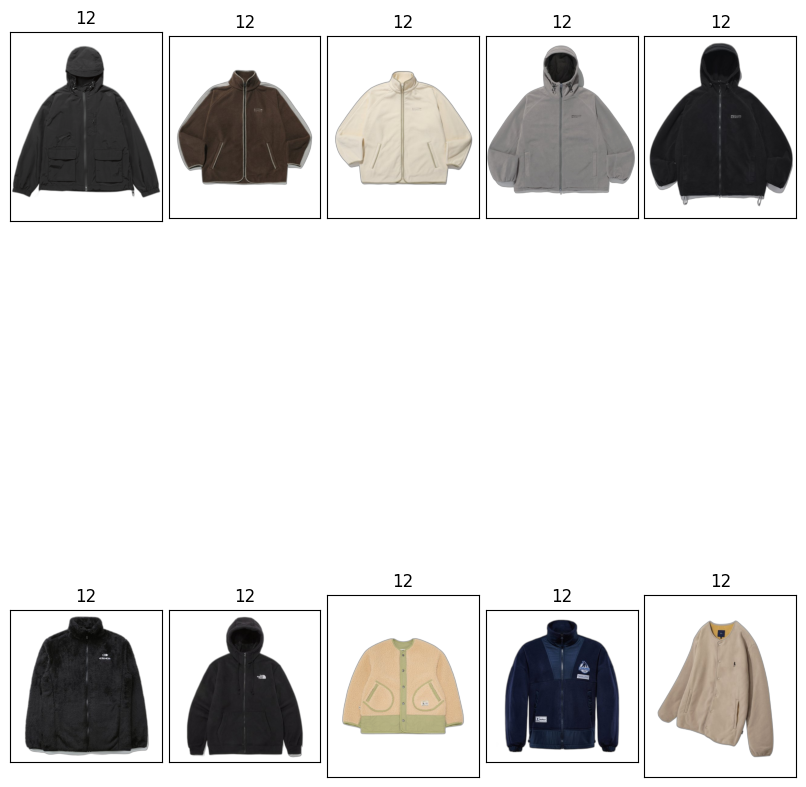

In [12]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(8, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(df['file_path'].iloc[i]))
    ax.set_title(df['type'].iloc[i], fontsize = 12)
plt.tight_layout(pad=0.5)
plt.show()

### PYTORCH에서 쓰는 방식으로 변경

In [13]:
# 데이터셋 정의
class CustomDataset(Dataset):
    def __init__(self, dataframe, image_path, transform=None):
        self.dataframe = dataframe
        self.image_path = image_path
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_name = self.dataframe.iloc[idx, 0]
        img_path = self.image_path[idx]

        image = Image.open(img_path)

        if image.mode == 'RGBA':
            r, g, b, a = image.split()
            bg = Image.new('RGB', image.size, (255,255,255)) # 검정 배경
            bg.paste(image, mask=a)
            image = bg

        label = int(self.dataframe.iloc[idx, 1])

        if self.transform:
            image = self.transform(image)

        return image, label

def custom_imshow(img):
    img = img.numpy()
    plt.imshow(np.transpose(img, (1, 2, 0)))
    plt.show()

In [14]:
def resize_and_pad(image, size=256):
    # 이미지의 원래 크기와 비율 계산
    w, h = image.size
    ratio = w / h

    # 장축을 256에 맞추고, 단축은 비율에 맞춰서 줄임
    if w > h:
        new_w = size
        new_h = int(size / ratio)
    else:
        new_h = size
        new_w = int(size * ratio)

    # 이미지 리사이즈
    resize_transform = transforms.Resize((new_h, new_w))
    image = resize_transform(image)

    # 빈 부분을 검정색으로 채우기
    pad_w = size - new_w
    pad_h = size - new_h

    pad_transform = transforms.Pad((pad_w // 2, pad_h // 2, pad_w - pad_w // 2, pad_h - pad_h // 2), fill=255)
    image = pad_transform(image)

    return image

In [15]:
# 데이터셋 객체 생성
transform = transforms.Compose(
    [
        transforms.Lambda(lambda img: resize_and_pad(img)),
        transforms.RandomApply([
            transforms.RandomHorizontalFlip(),
            transforms.RandomVerticalFlip(),
            transforms.RandomRotation(180),
        ], p=0.9),
        transforms.ToTensor(), 
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ]
)

In [16]:
dataset = CustomDataset(dataframe=df, image_path=df['file_path'].tolist(), transform=transform)

train_size = int(0.8 * len(dataset))
valid_size = int(0.1 * len(dataset))
test_size = len(dataset) - (train_size + valid_size)
train_dataset, valid_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, valid_size, test_size])

trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2)
validloader = torch.utils.data.DataLoader(valid_dataset, batch_size=8, shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


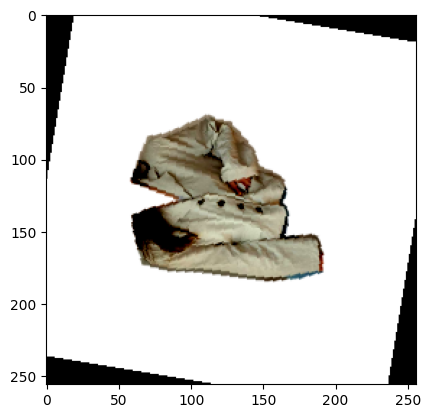

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


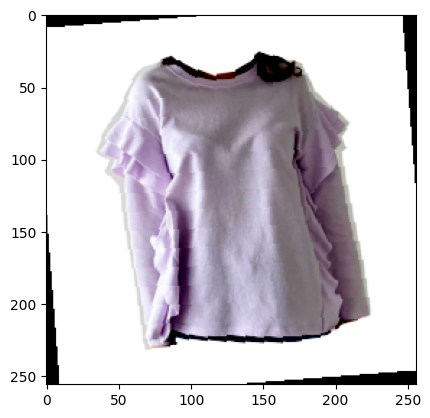

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


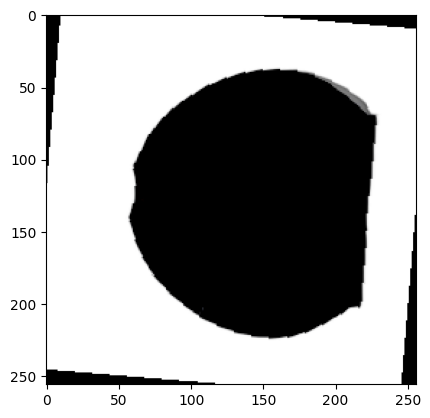

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


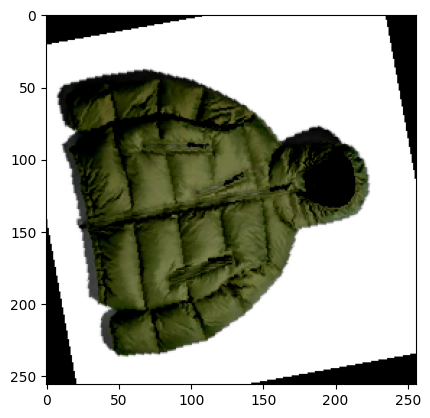

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


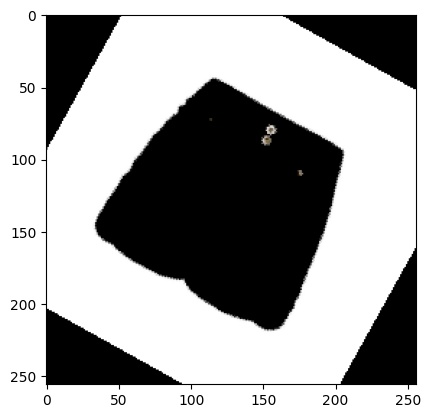

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


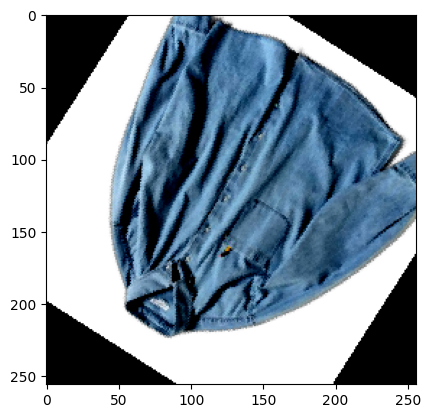

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


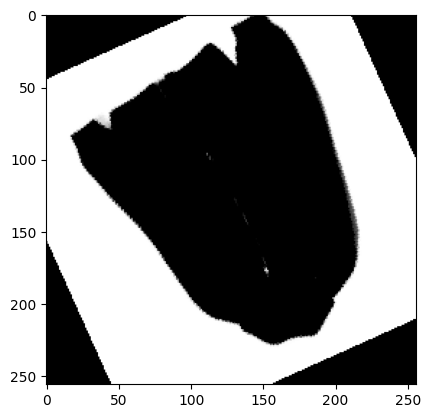

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


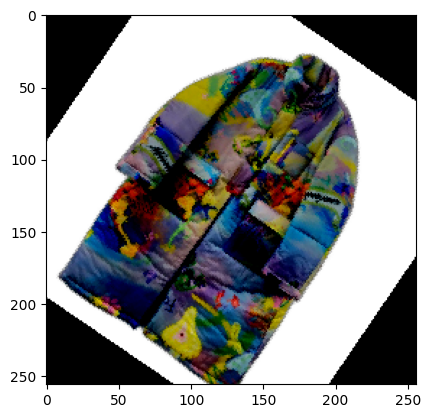

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


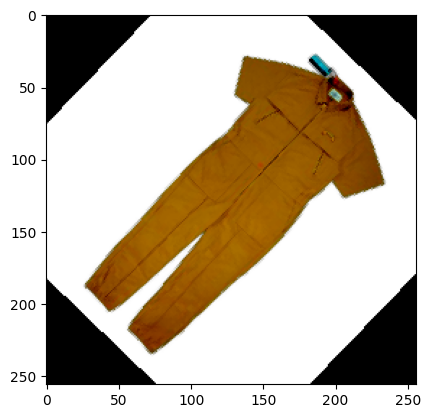

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


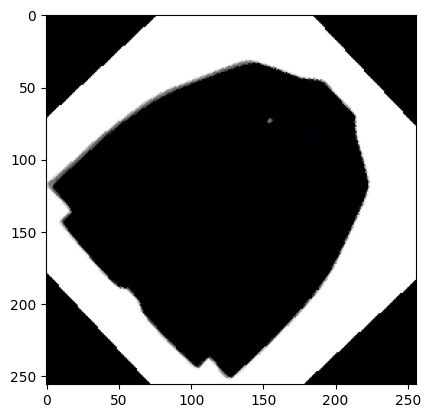

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


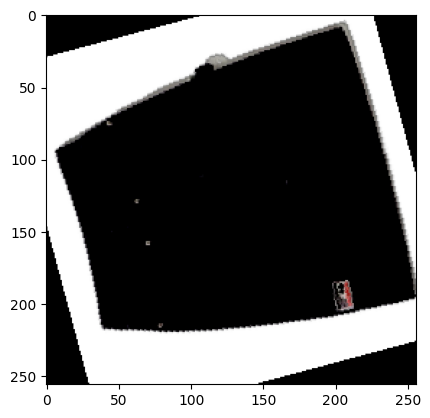

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


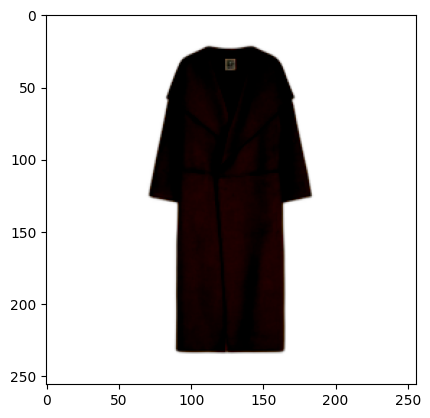

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


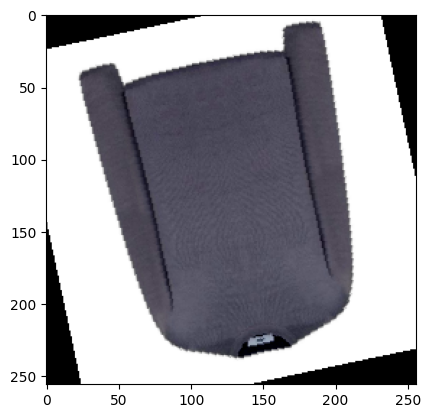

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


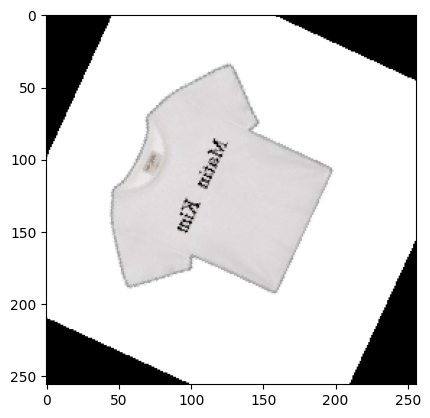

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


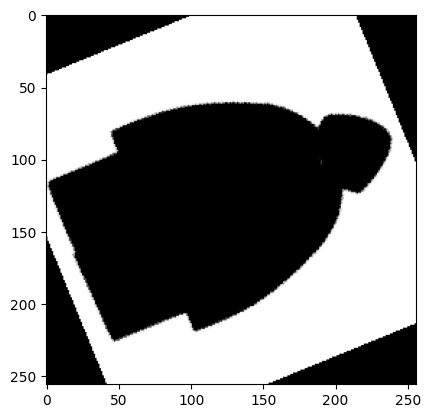

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


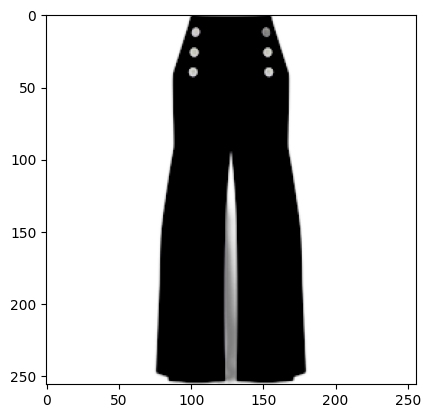

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


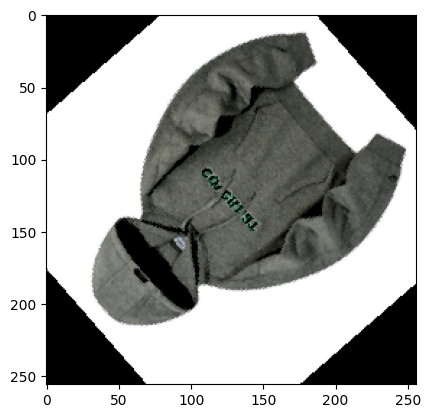

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


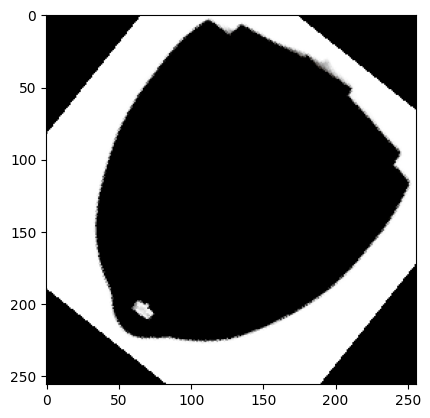

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


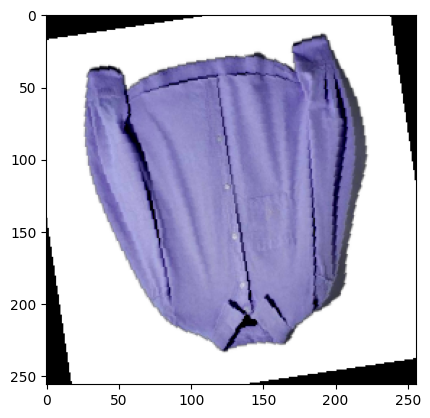

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


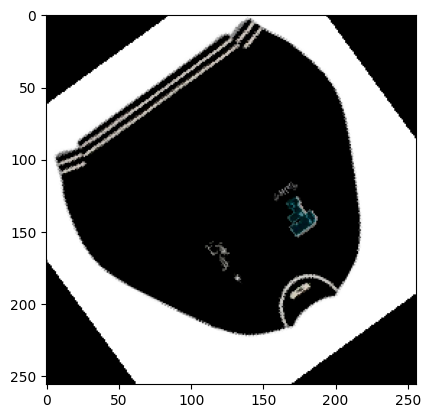

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


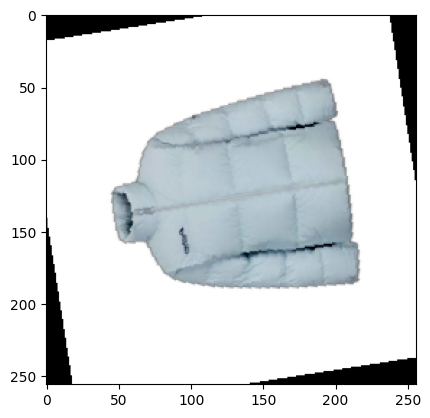

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


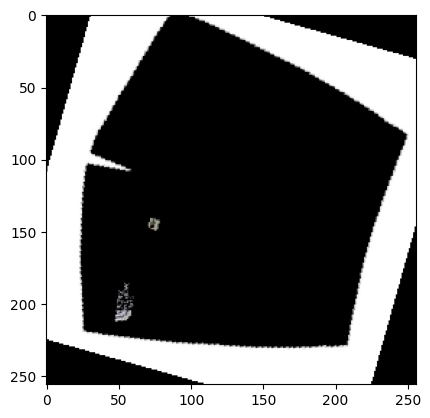

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


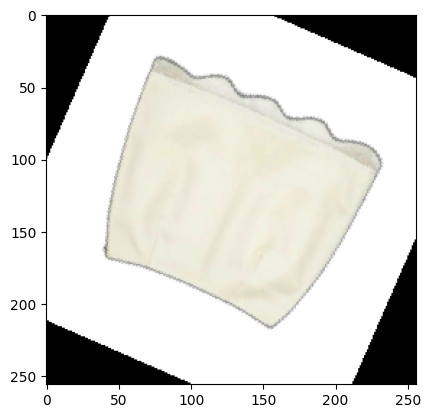

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


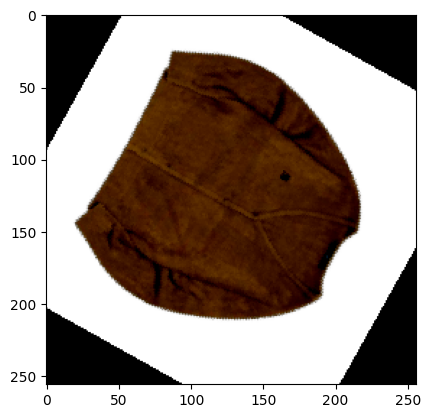

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


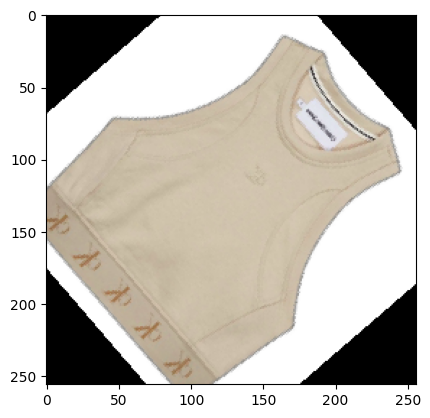

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


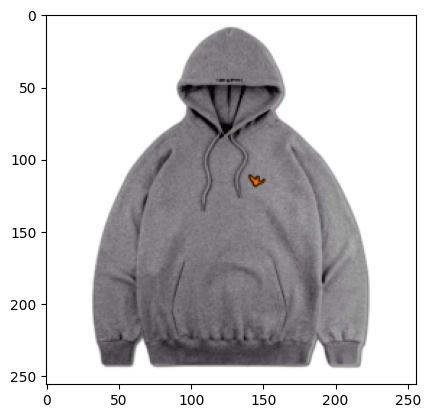

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


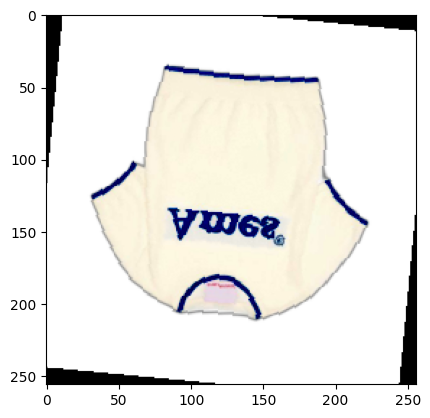

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


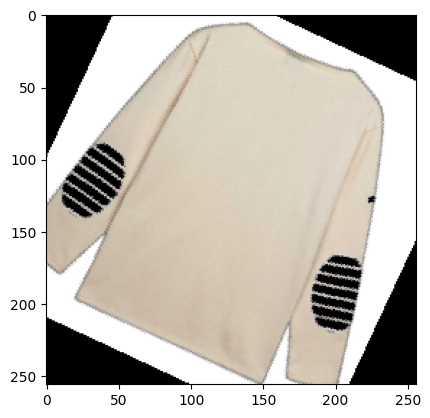

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


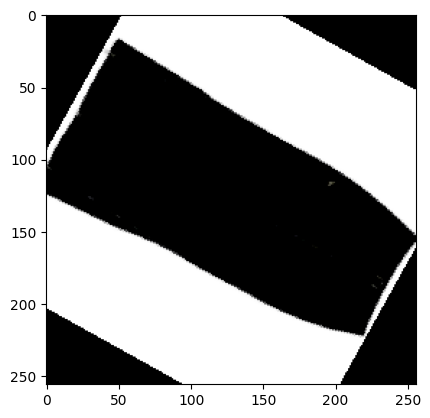

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


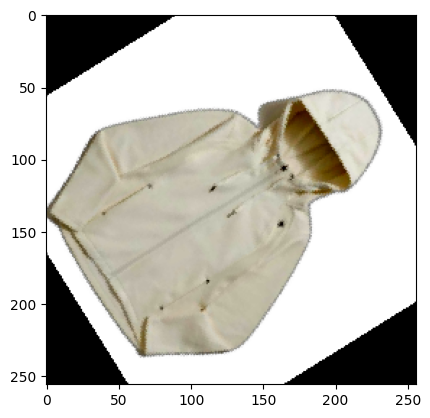

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


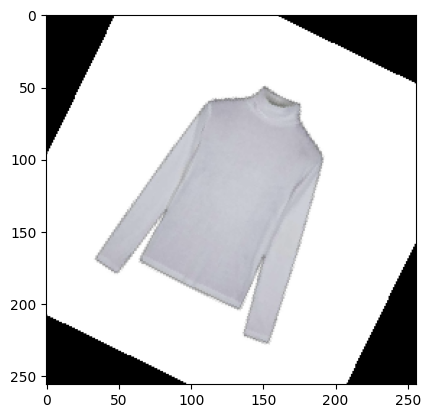

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


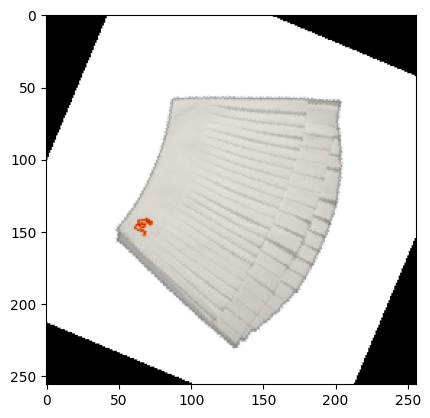

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


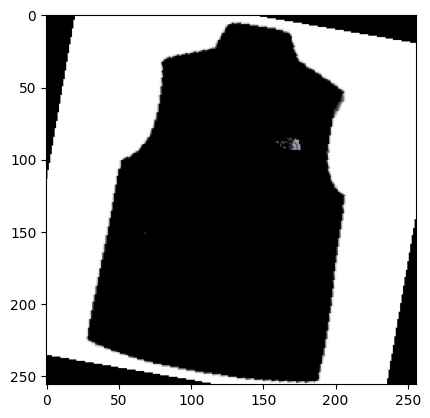

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


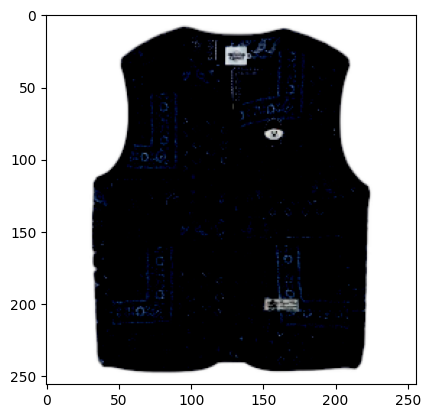

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


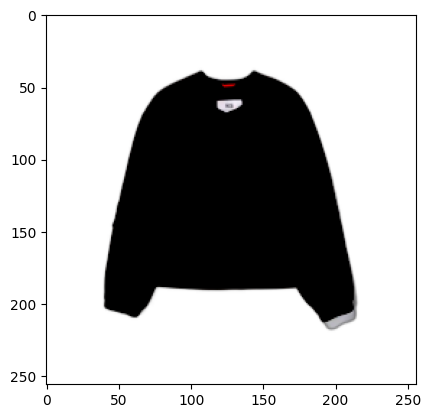

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


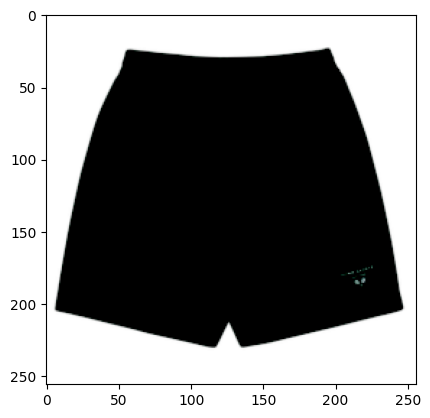

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


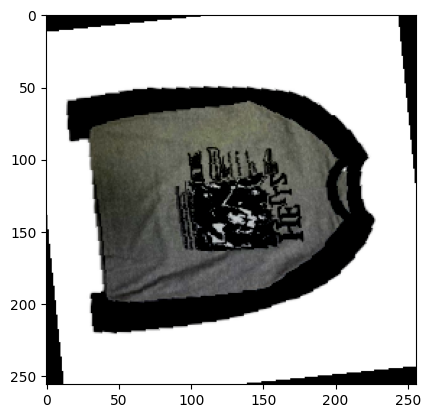

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


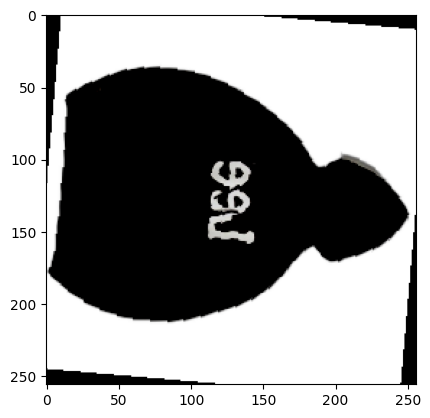

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


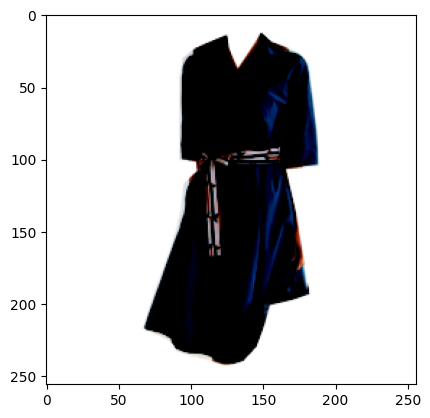

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


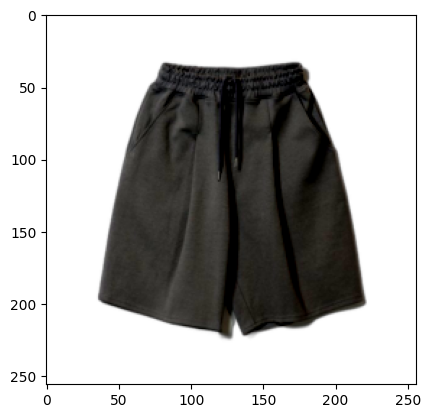

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


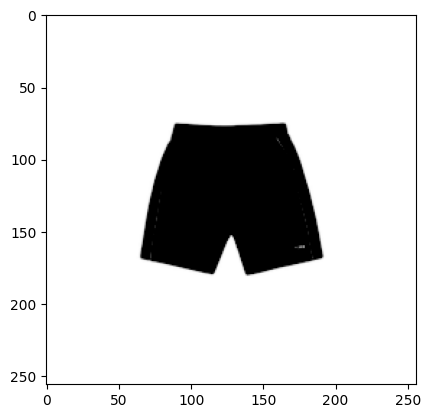

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


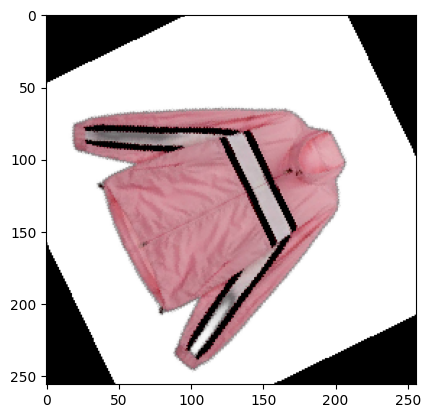

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


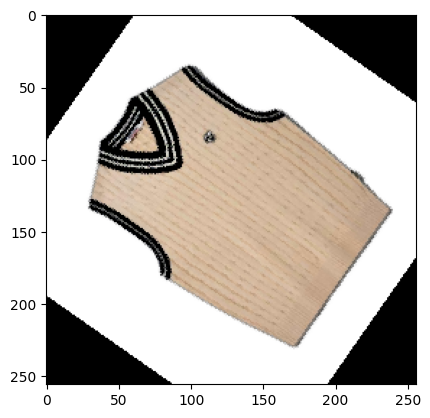

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


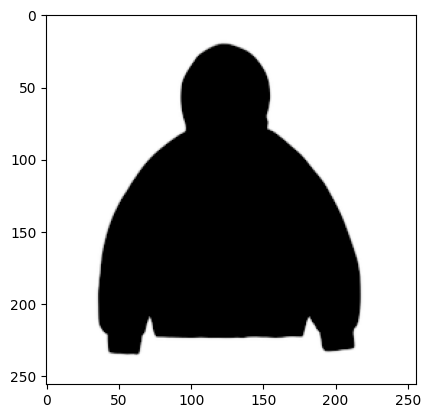

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


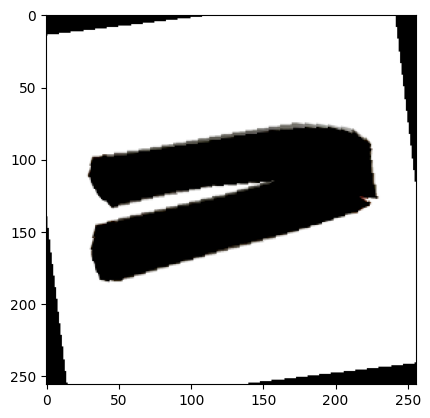

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


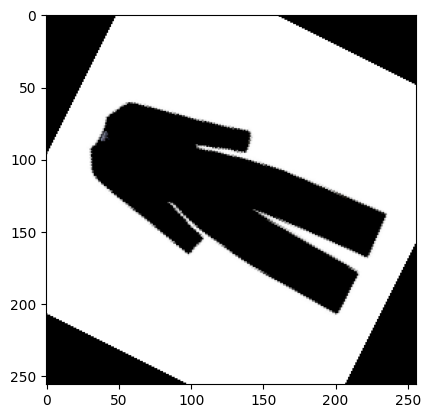

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


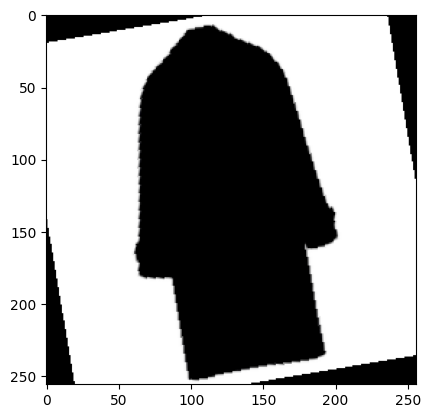

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


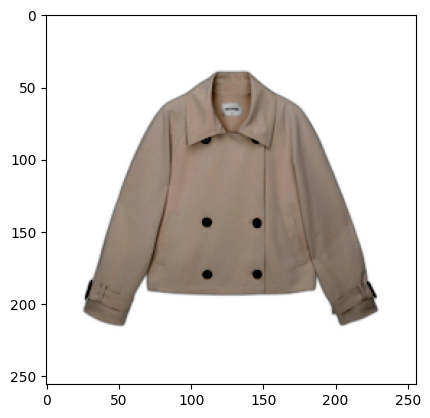

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


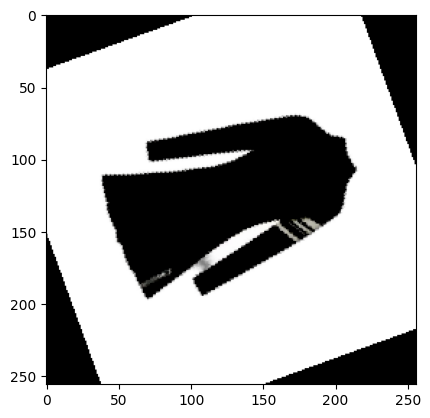

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


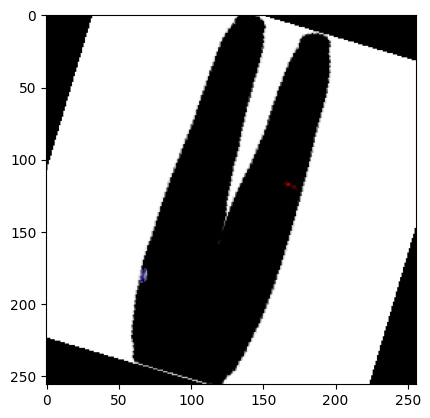

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


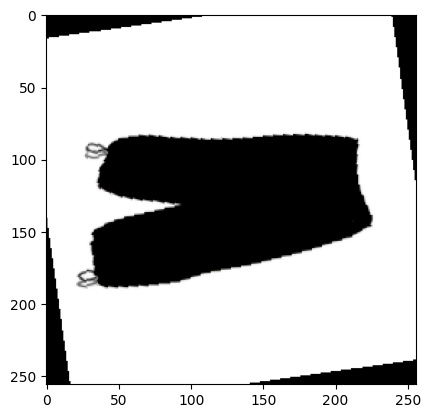

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


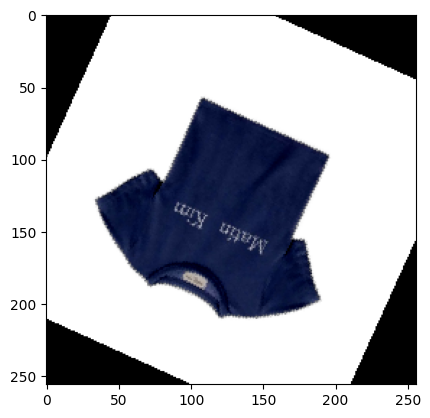

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


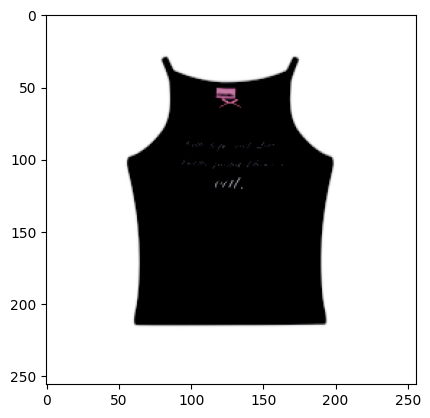

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


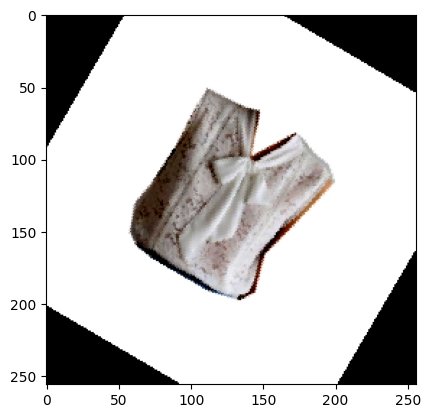

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


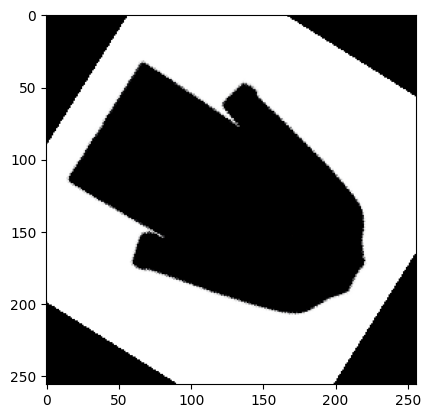

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


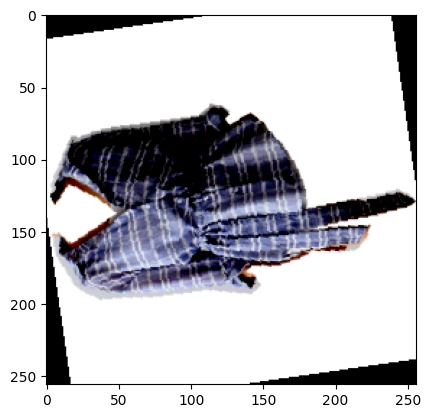

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


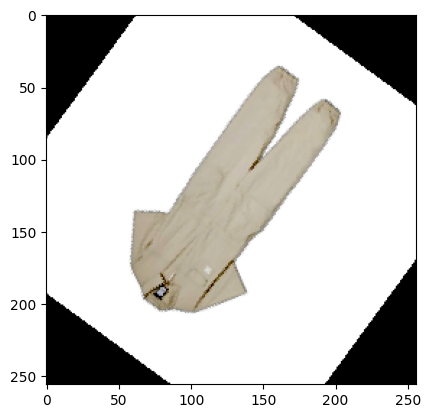

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


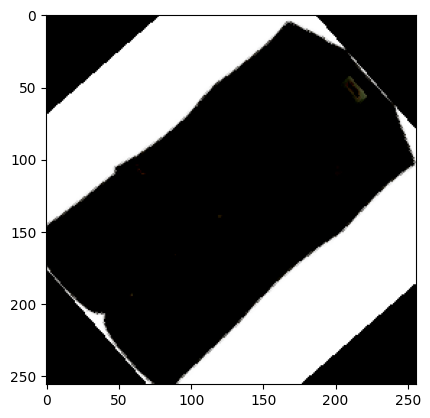

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


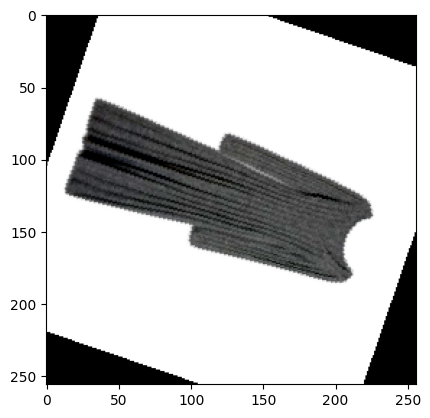

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


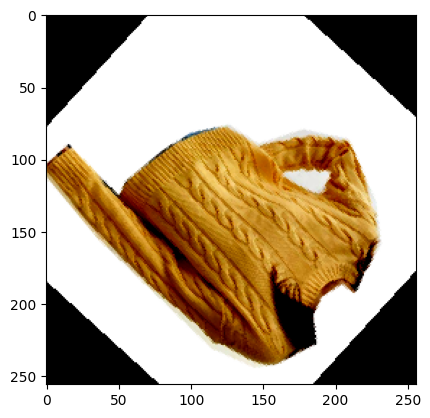

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


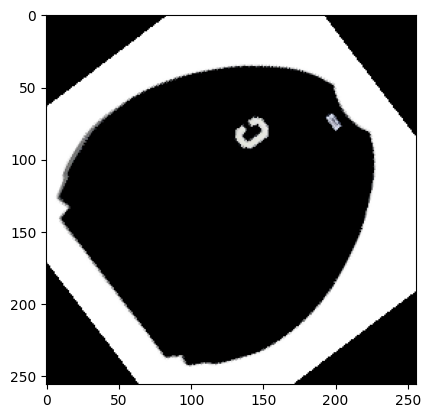

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


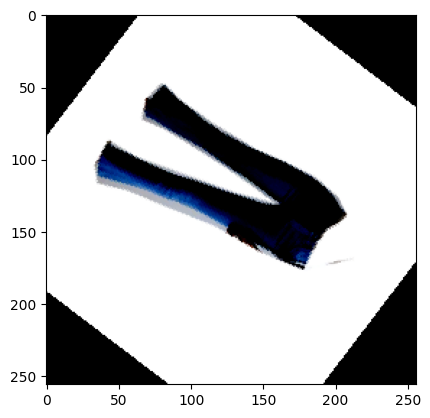

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


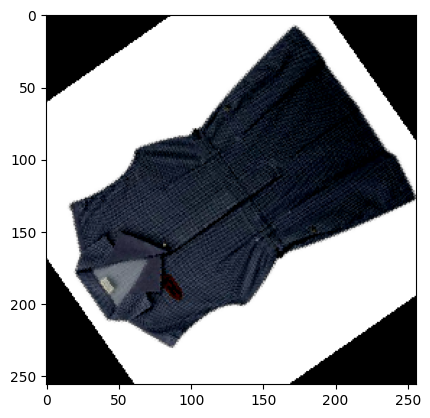

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


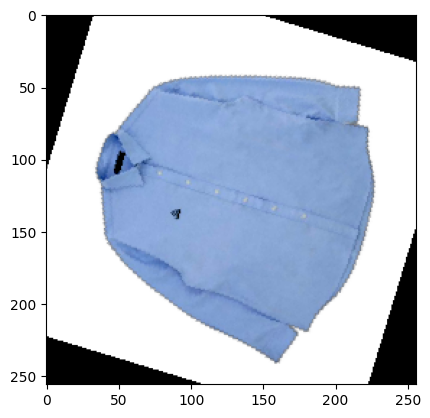

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


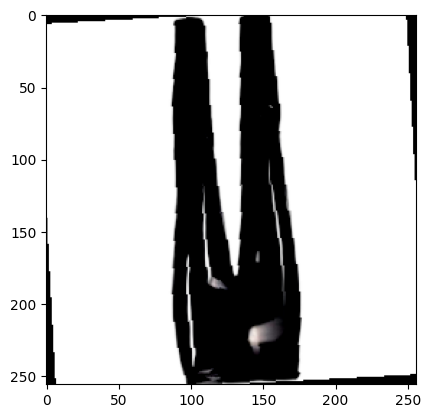

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


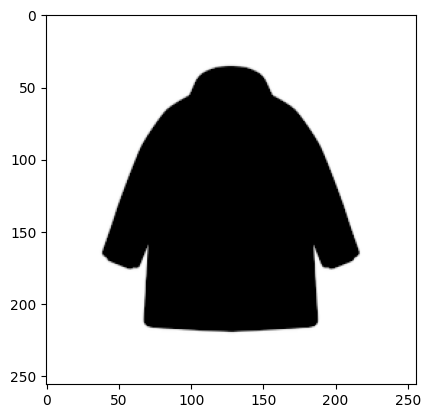

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


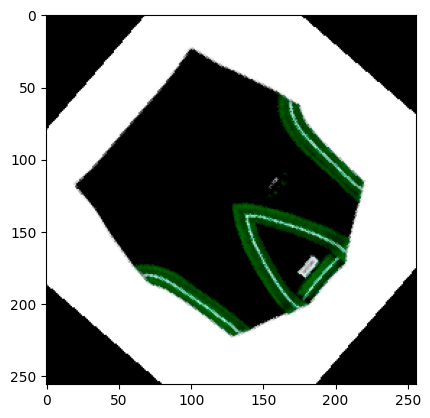

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


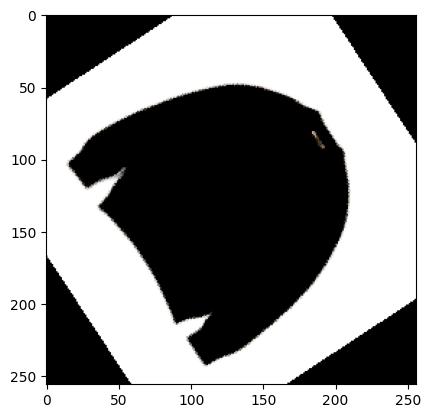

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


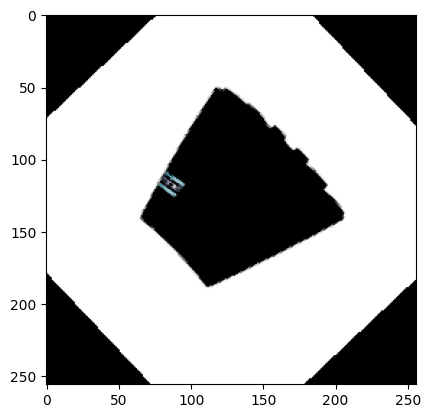

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


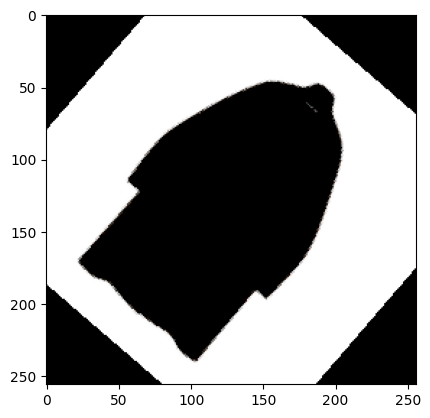

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


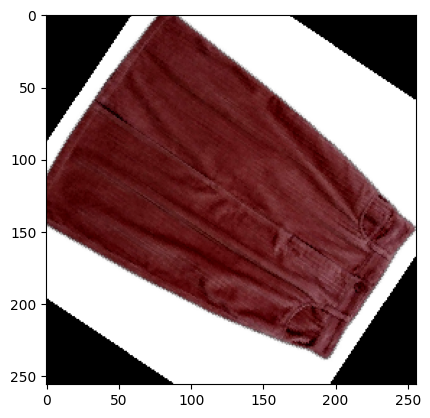

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


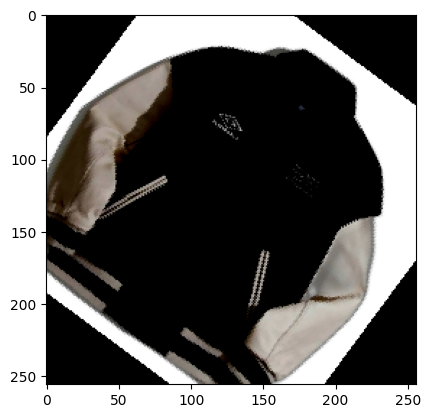

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


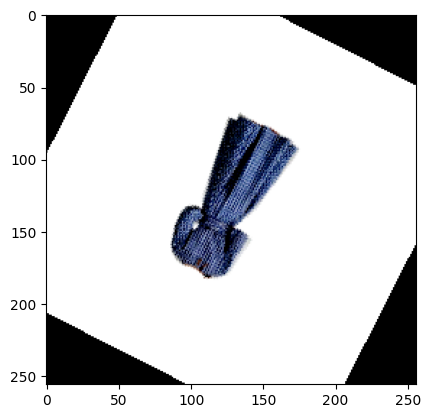

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


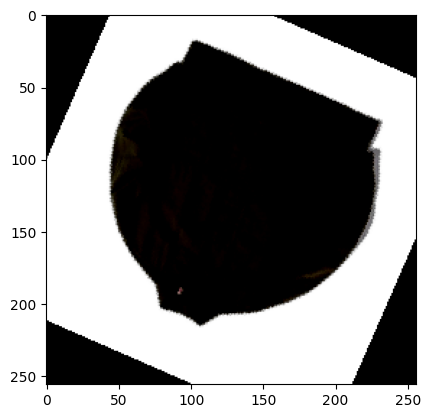

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


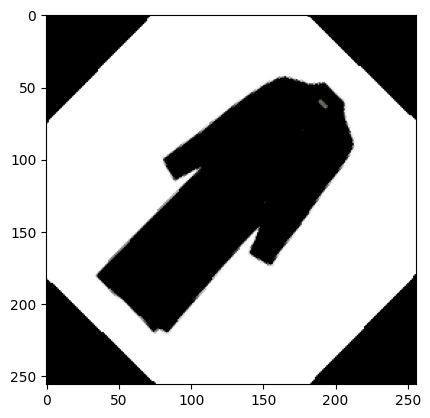

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


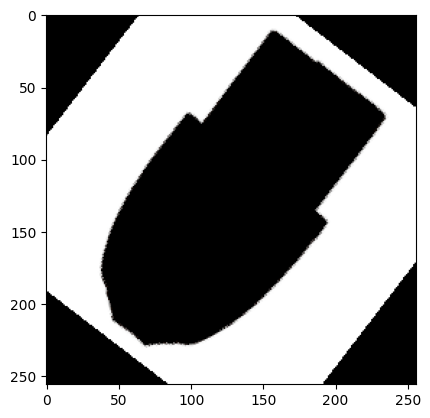

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


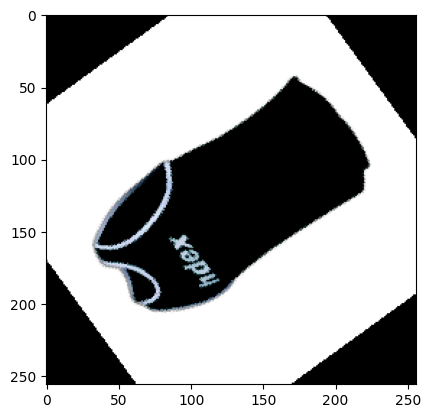

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


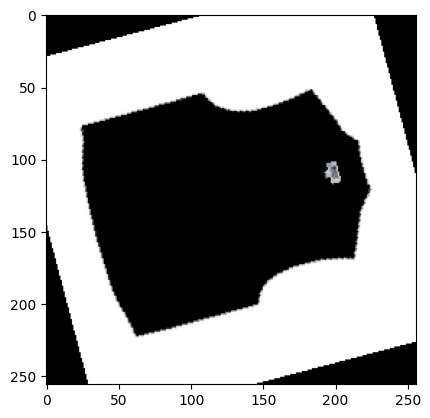

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


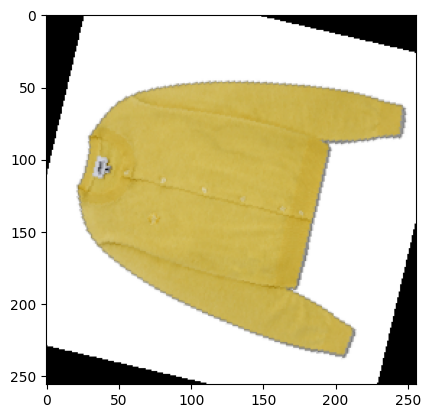

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


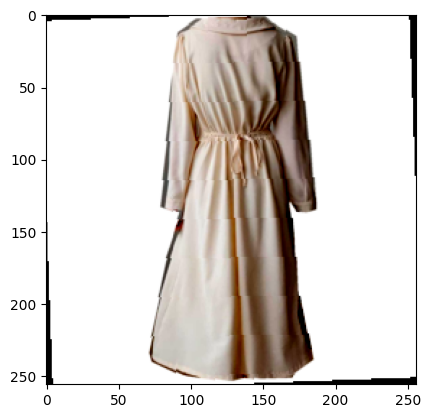

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


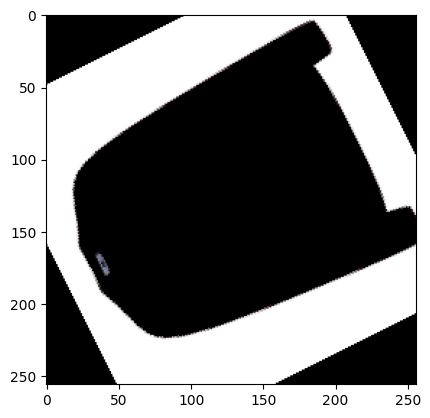

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


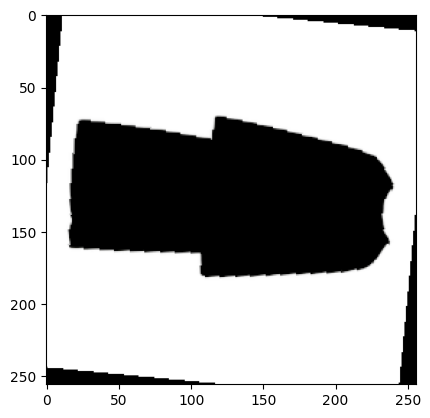

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


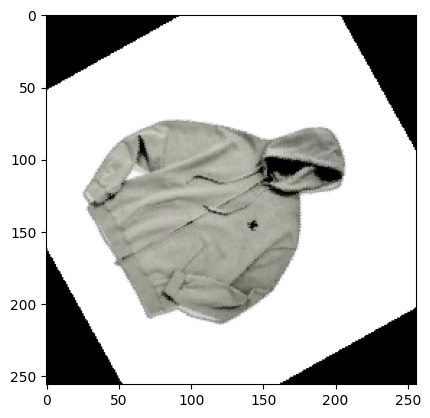

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


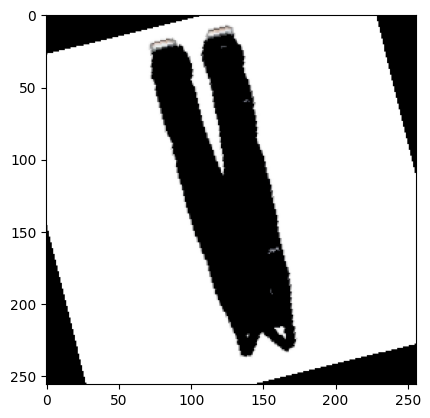

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


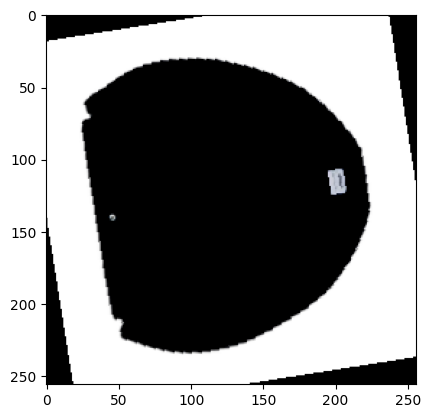

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


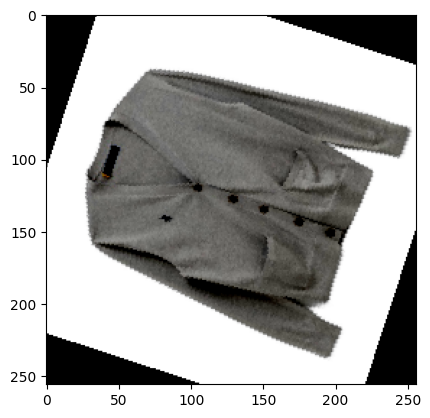

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


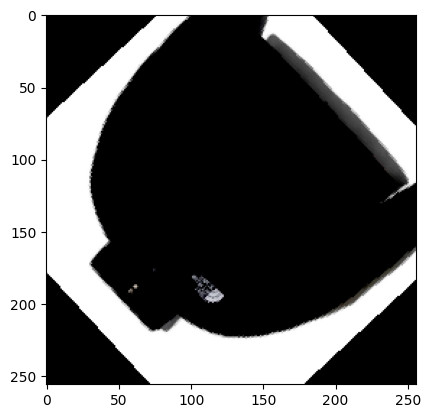

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


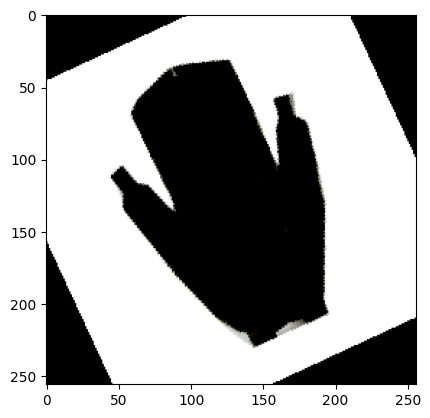

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


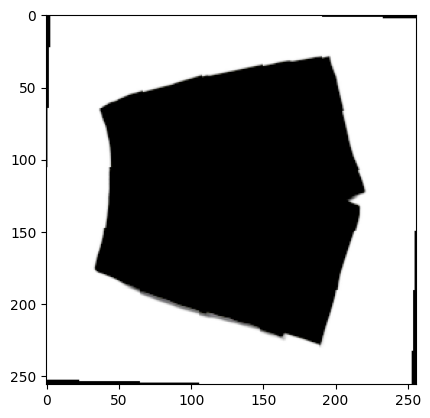

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


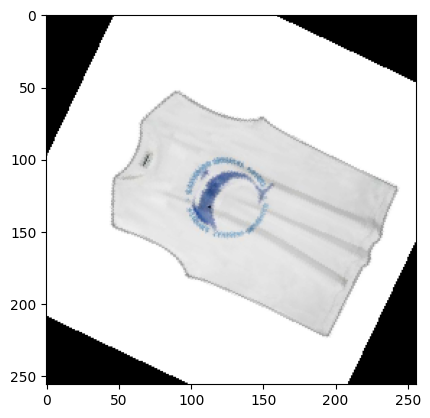

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


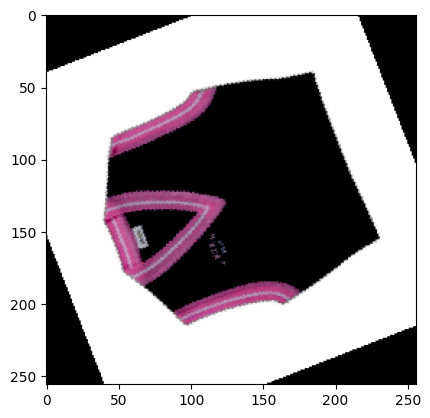

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


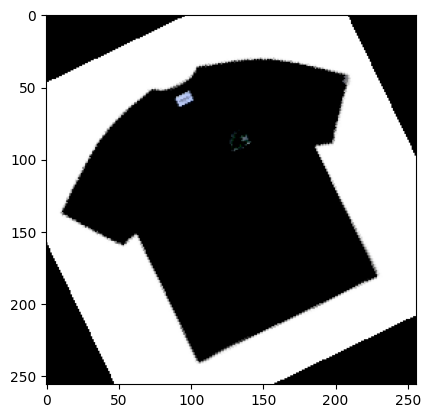

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


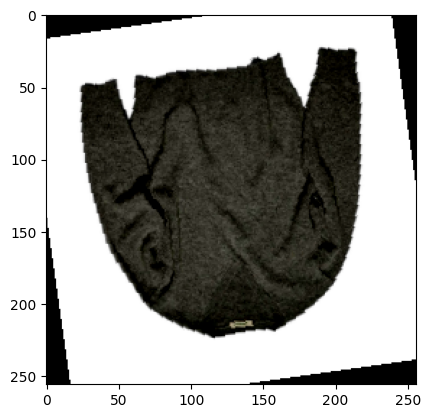

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


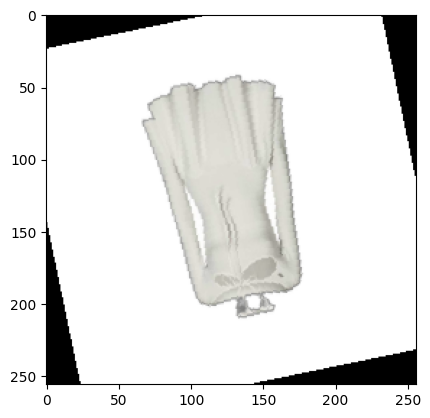

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


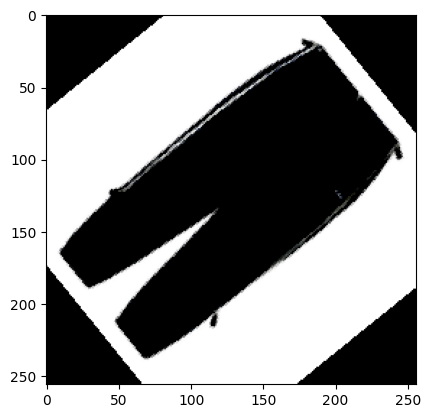

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


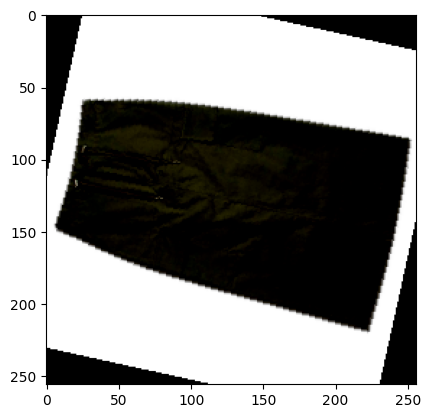

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


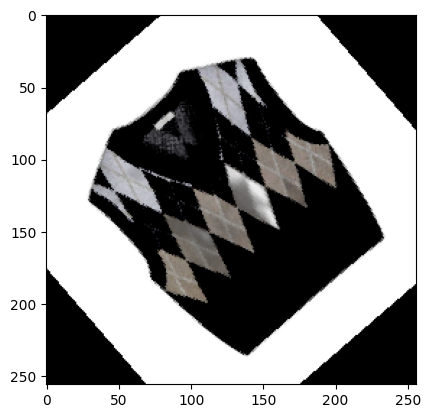

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


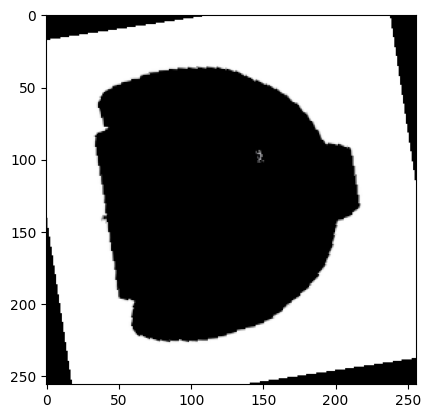

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


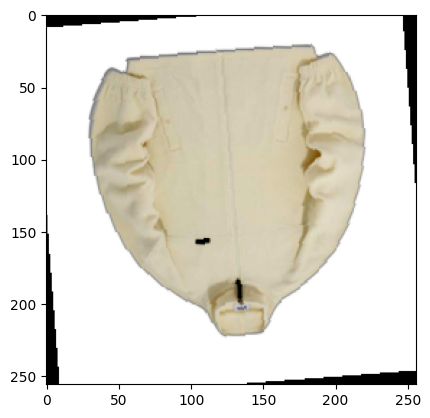

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


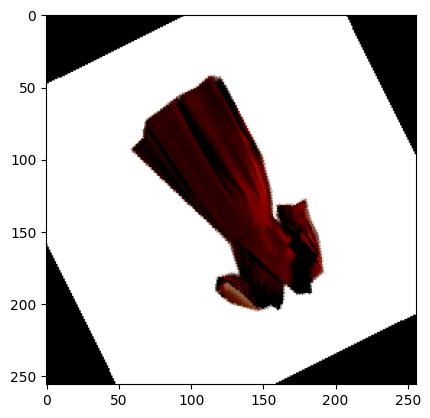

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


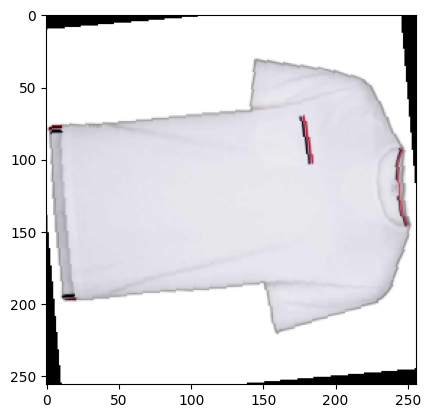

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


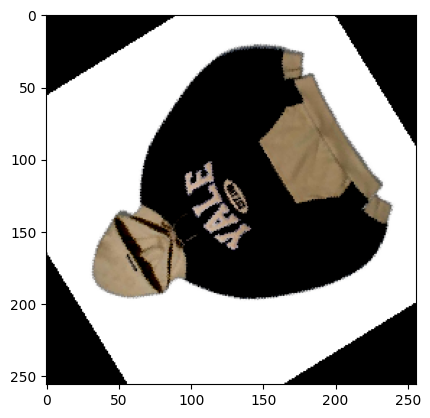

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


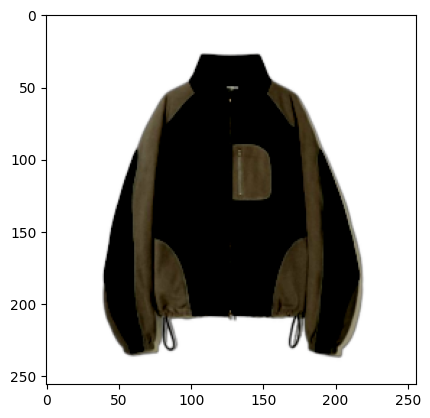

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


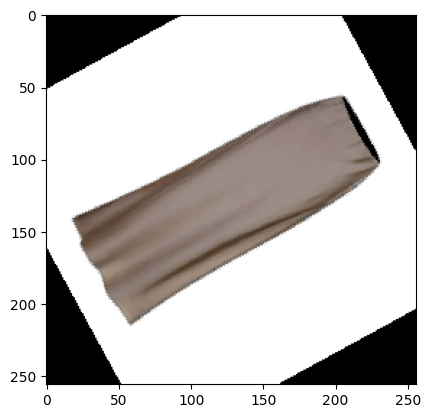

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


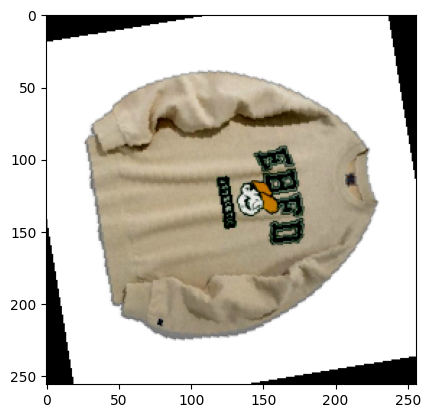

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


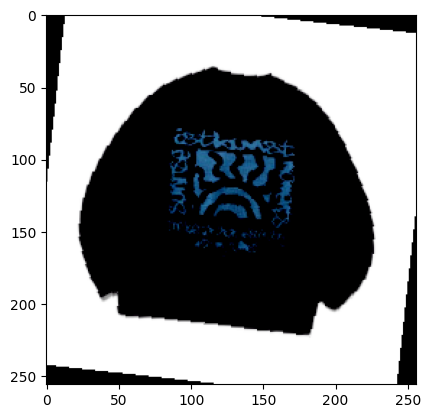

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


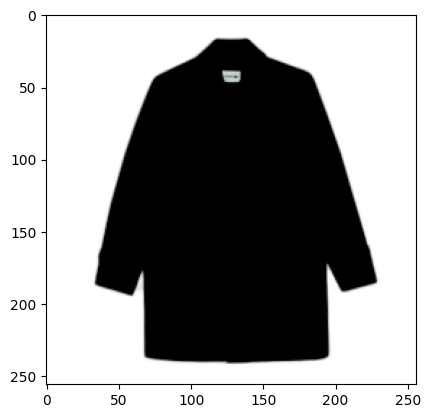

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


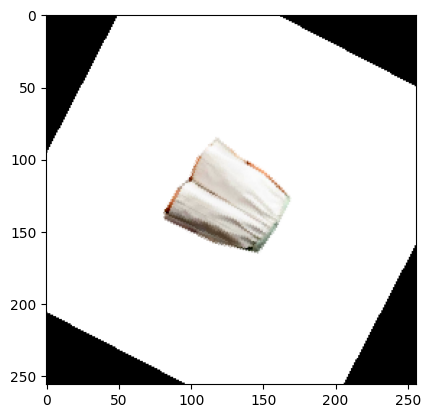

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


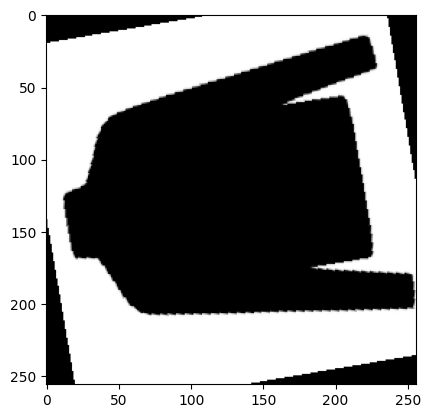

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


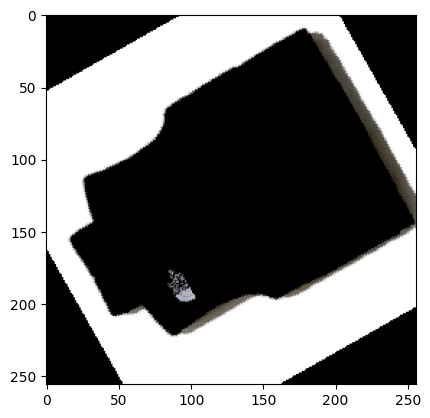

In [17]:
for i, (image, label) in enumerate(validloader):
    custom_imshow(image[0])

# Model 생성

In [18]:
weights = models.EfficientNet_V2_S_Weights.DEFAULT
model = models.efficientnet_v2_s(weights = weights)
model.classifier[1].out_features = 18

In [19]:
# print(weights.transforms())
print(model.classifier)

Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=18, bias=True)
)


In [20]:
criterion = nn.CrossEntropyLoss()
# optimizer = optim.Adam(model.parameters(), lr=0.001)
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9, weight_decay=5e-4)

## Train

In [21]:
model = model.to(device)

# 조기 종료 변수 초기화
early_stopping_epochs = 5
best_loss = float('inf')
early_stop_counter = 0

for epoch in range(100):
    # 학습
    model.train()
    train_loss = 0.0
    
    # tqdm으로 진행 바 추가
    for i, data in tqdm(enumerate(trainloader), total=len(trainloader)):
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        
    # 겁증
    model.eval()
    valid_loss = 0.0
    with torch.no_grad():
        for data in validloader:
            input, label = data
            input, label = input.to(device), label.to(device)
            output = model(input)
            loss = criterion(output, label)
            valid_loss += loss.item()

    print(f"Epoch {epoch+1}, Loss: {valid_loss/len(validloader)}")
    
    # 검증 데이터셋의 손실이 이전보다 증가한 경우
    if valid_loss > best_loss:
        early_stop_counter += 1
    else:
        best_loss = valid_loss
        early_stop_counter = 0
    # 조기 종료 조건 확인
    if early_stop_counter >= early_stopping_epochs:
        print("Early Stopping!")
        break

print('Finished Training')

100%|██████████| 880/880 [01:09<00:00, 12.67it/s]


Epoch 1, Loss: 1.3799400145357306


100%|██████████| 880/880 [01:08<00:00, 12.84it/s]


Epoch 2, Loss: 0.8570563086054542


100%|██████████| 880/880 [01:08<00:00, 12.88it/s]


Epoch 3, Loss: 0.5057810921221971


100%|██████████| 880/880 [01:09<00:00, 12.73it/s]


Epoch 4, Loss: 0.46054632386870004


100%|██████████| 880/880 [01:06<00:00, 13.26it/s]


Epoch 5, Loss: 0.3749843755228953


100%|██████████| 880/880 [01:09<00:00, 12.67it/s]


Epoch 6, Loss: 0.29980712970295414


100%|██████████| 880/880 [01:10<00:00, 12.51it/s]


Epoch 7, Loss: 0.3207456006499177


100%|██████████| 880/880 [01:08<00:00, 12.83it/s]


Epoch 8, Loss: 0.36172467119018126


100%|██████████| 880/880 [01:10<00:00, 12.53it/s]


Epoch 9, Loss: 0.2937289562319744


100%|██████████| 880/880 [01:08<00:00, 12.89it/s]


Epoch 10, Loss: 0.2501008625131693


100%|██████████| 880/880 [01:06<00:00, 13.19it/s]


Epoch 11, Loss: 0.2832921109037918


100%|██████████| 880/880 [01:05<00:00, 13.50it/s]


Epoch 12, Loss: 0.2690555336419493


100%|██████████| 880/880 [01:04<00:00, 13.59it/s]


Epoch 13, Loss: 0.29032602526713164


100%|██████████| 880/880 [01:04<00:00, 13.59it/s]


Epoch 14, Loss: 0.2750722333730664


100%|██████████| 880/880 [01:04<00:00, 13.54it/s]


Epoch 15, Loss: 0.2930971630944193
Early Stopping!
Finished Training


## Test

In [22]:
from tqdm import tqdm

def test(model, testloader, criterion):
    model.eval()  # 모델을 평가 모드로 설정
    test_loss = 0.0
    correct = 0
    total = 0
    
    with torch.no_grad():  # Gradient 계산을 하지 않음 (테스트 중이므로 필요 없음)
        for i, data in tqdm(enumerate(testloader), total=len(testloader), desc="Testing"):
            inputs, labels = data
            inputs, labels = inputs.to(device), labels.to(device)
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            test_loss += loss.item()
            
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

    accuracy = 100 * correct / total
    print(f"\nTest Loss: {test_loss/len(testloader)}, Accuracy: {accuracy:.2f}%")
    
    return accuracy, test_loss/len(testloader)

# 이렇게 test 함수를 호출할 수 있습니다:
test_accuracy, test_loss = test(model, testloader, criterion)

Testing: 100%|██████████| 111/111 [00:06<00:00, 16.95it/s]


Test Loss: 0.32727131727025716, Accuracy: 90.47%


In [23]:
torch.save(model.state_dict(), 'efficientnet_v2_s_type_ver1.pth')

## Inference

Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=18, bias=True)
)


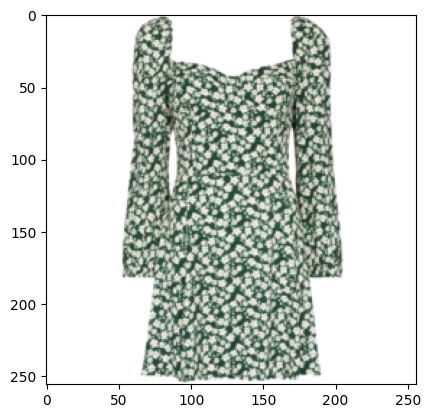

예측치: 
원피스 - 1269.40 점프수트 - 844.13 민소매 - 804.18 


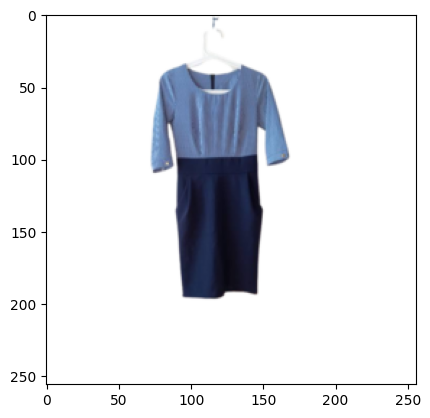

예측치: 
원피스 - 1839.61 점프수트 - 1011.34 셔츠/블라우스 - 792.60 


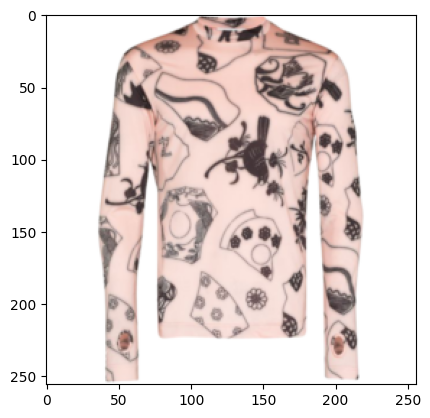

예측치: 
긴팔티 - 1078.37 니트웨어 - 1077.80 재킷 - 1061.23 


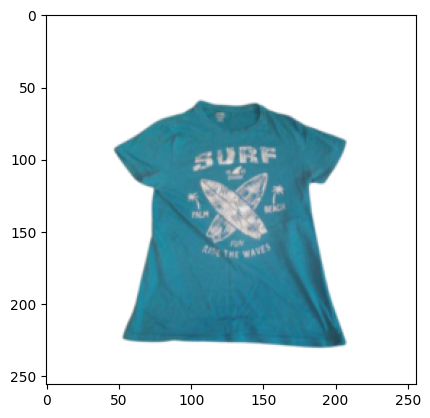

예측치: 
반팔티 - 1517.85 민소매 - 874.38 셔츠/블라우스 - 782.52 


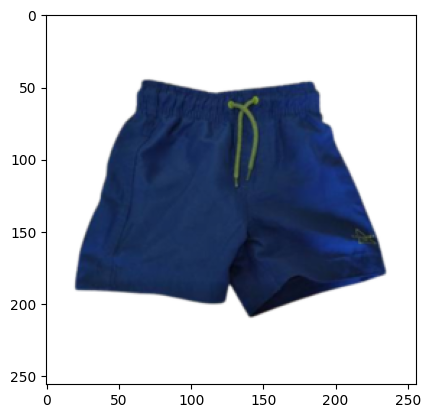

예측치: 
반바지 - 1936.28 미니스커트 - 625.40 베스트 - 597.41 


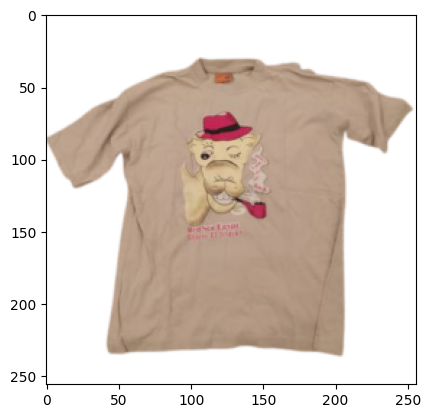

예측치: 
반팔티 - 1544.55 긴팔티 - 1049.15 셔츠/블라우스 - 737.81 


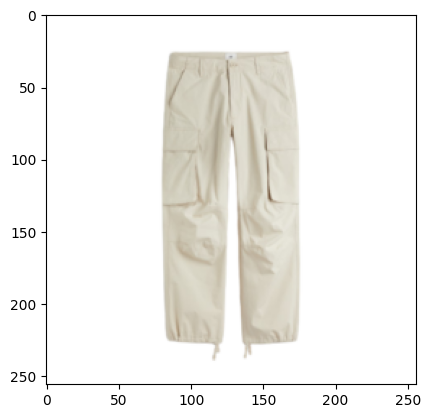

예측치: 
긴바지 - 1864.32 점프수트 - 995.71 후드티 - 516.26 


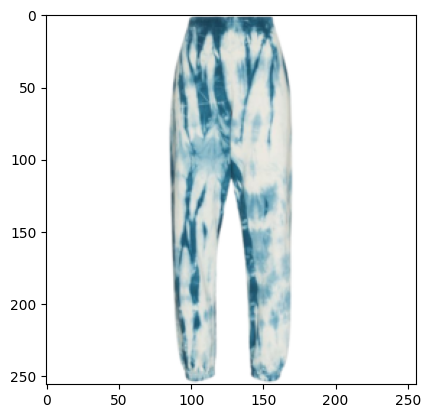

예측치: 
긴바지 - 1746.57 니트웨어 - 931.66 가디건 - 852.82 


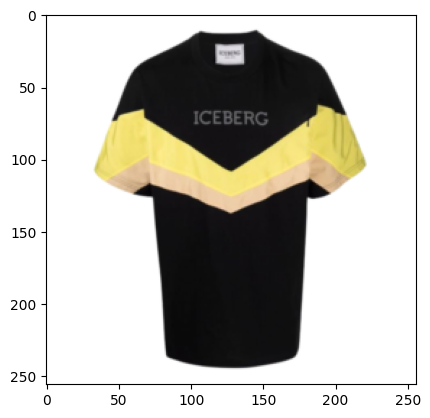

예측치: 
반팔티 - 1138.34 긴팔티 - 775.28 점퍼/짚업 - 745.68 


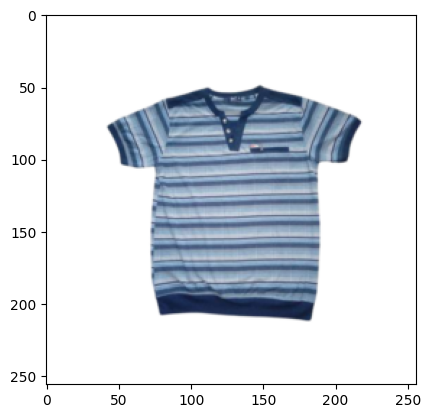

예측치: 
반팔티 - 1232.82 셔츠/블라우스 - 942.77 니트웨어 - 847.76 


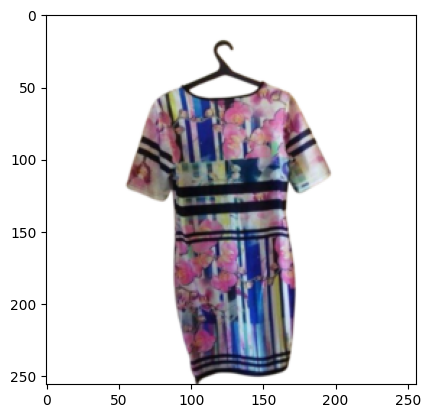

예측치: 
원피스 - 1222.49 점프수트 - 1168.78 셔츠/블라우스 - 962.44 


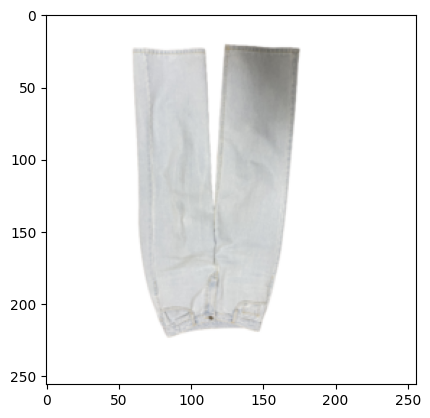

예측치: 
긴바지 - 1758.57 점프수트 - 924.77 롱스커트 - 807.40 


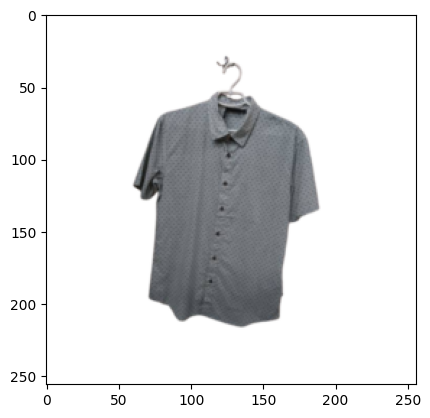

예측치: 
셔츠/블라우스 - 1214.38 베스트 - 834.97 원피스 - 789.92 


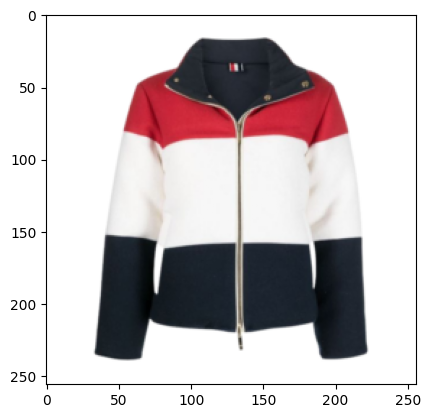

예측치: 
점퍼/짚업 - 1184.17 가디건 - 1124.40 재킷 - 921.97 


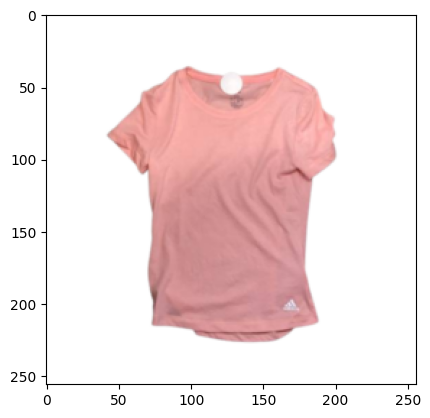

예측치: 
반팔티 - 1595.00 민소매 - 1142.16 긴팔티 - 831.42 


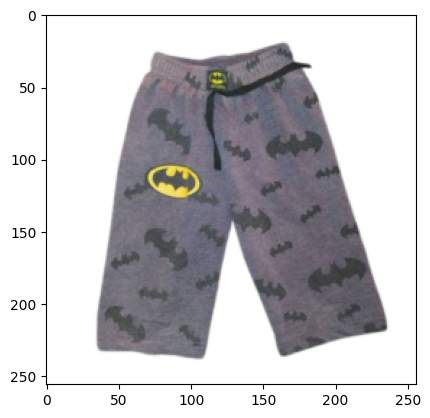

예측치: 
반바지 - 1475.22 긴바지 - 1218.84 롱스커트 - 611.18 


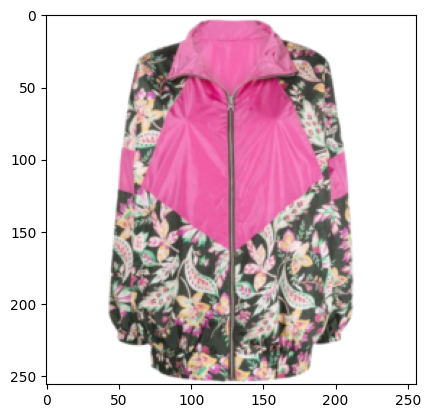

예측치: 
롱스커트 - 892.59 셔츠/블라우스 - 853.39 점퍼/짚업 - 740.59 


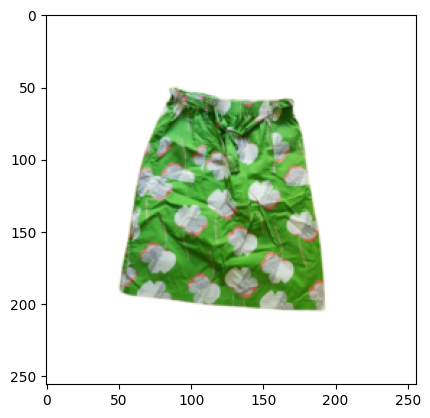

예측치: 
롱스커트 - 1478.34 미니스커트 - 1346.37 반바지 - 1022.10 


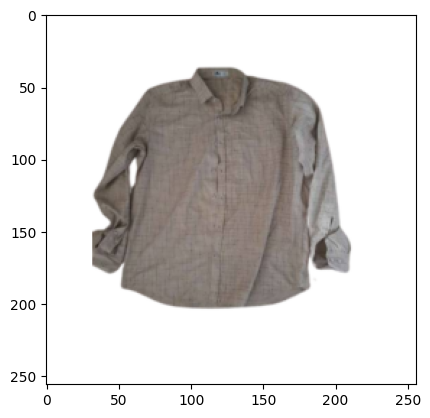

예측치: 
셔츠/블라우스 - 1600.43 니트웨어 - 1077.94 긴팔티 - 1000.12 


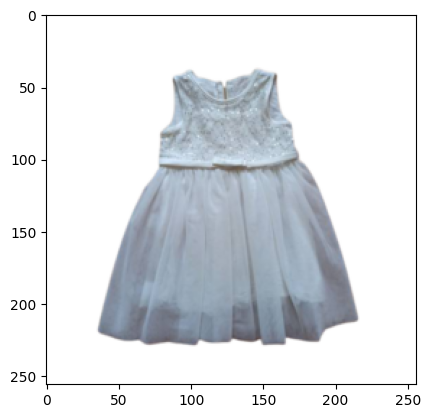

예측치: 
롱스커트 - 1189.52 원피스 - 1093.00 미니스커트 - 892.12 


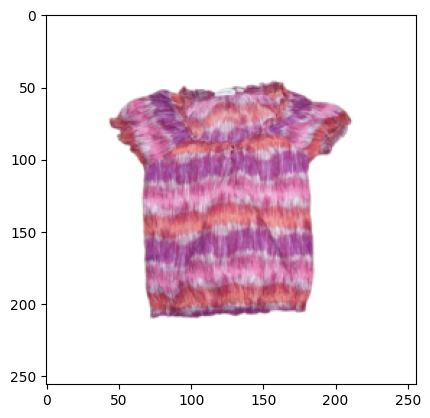

예측치: 
셔츠/블라우스 - 1575.72 원피스 - 1181.73 롱스커트 - 761.73 


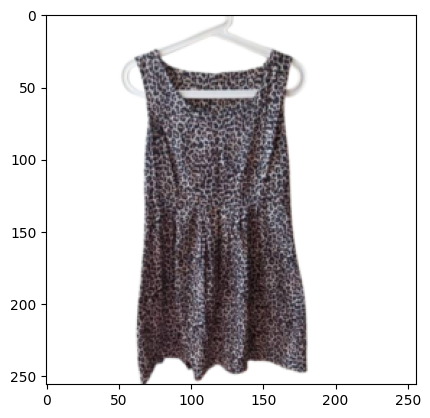

예측치: 
원피스 - 1478.95 민소매 - 1287.13 롱스커트 - 1137.66 


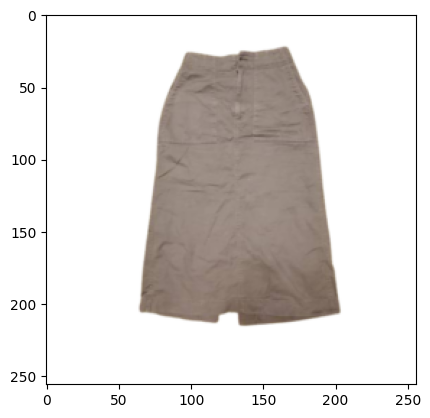

예측치: 
롱스커트 - 1953.78 원피스 - 1022.63 긴바지 - 940.43 


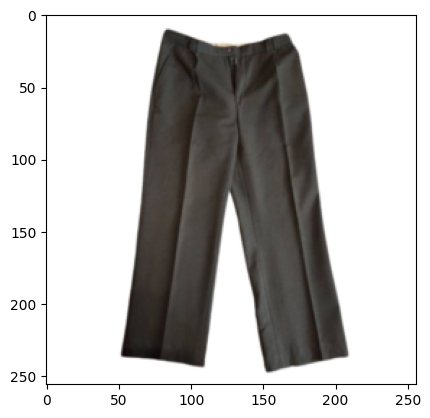

예측치: 
긴바지 - 1881.18 점프수트 - 899.55 셔츠/블라우스 - 798.70 


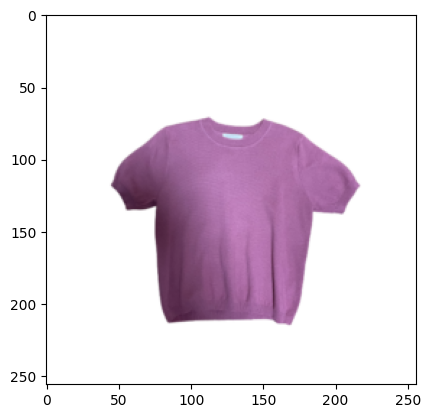

예측치: 
니트웨어 - 1243.42 반팔티 - 1155.12 긴팔티 - 1034.07 


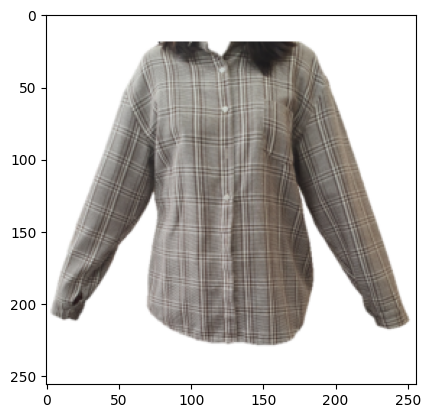

예측치: 
셔츠/블라우스 - 1526.59 재킷 - 1320.84 점퍼/짚업 - 946.25 


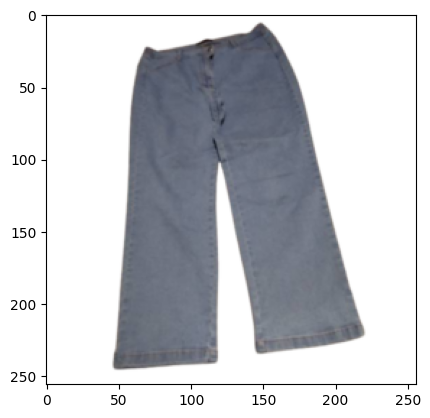

예측치: 
긴바지 - 1667.55 셔츠/블라우스 - 842.86 반바지 - 817.33 


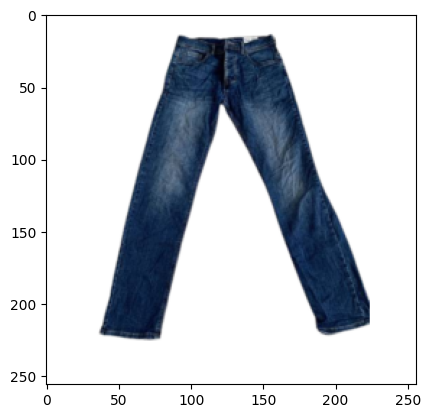

예측치: 
긴바지 - 1689.85 롱스커트 - 739.98 점퍼/짚업 - 707.10 


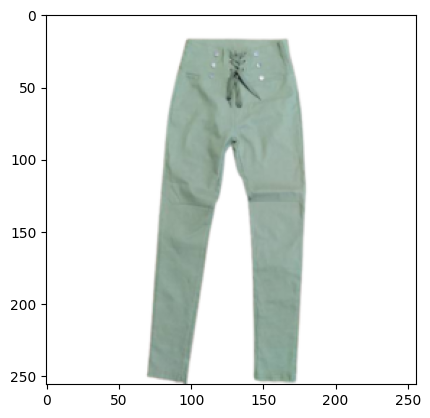

예측치: 
긴바지 - 1671.98 점프수트 - 1268.79 롱스커트 - 910.78 


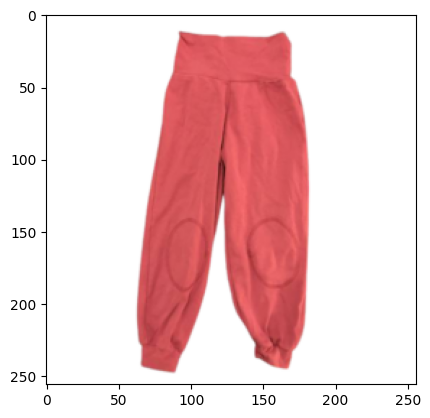

예측치: 
긴바지 - 1709.89 점프수트 - 823.69 셔츠/블라우스 - 777.29 


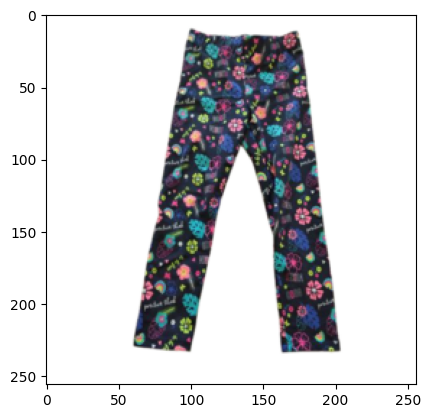

예측치: 
긴바지 - 1649.68 점프수트 - 768.87 롱스커트 - 744.33 


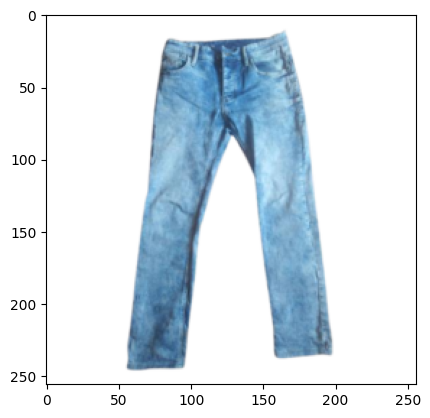

예측치: 
긴바지 - 1767.28 점프수트 - 827.43 셔츠/블라우스 - 667.88 


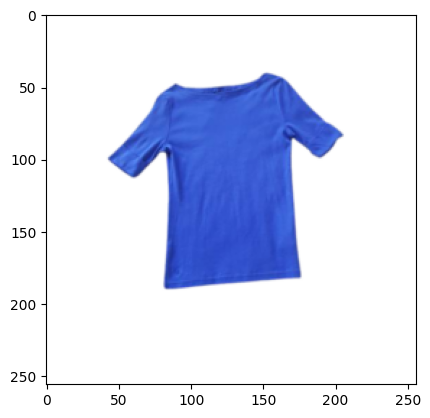

예측치: 
반팔티 - 1672.68 민소매 - 1154.03 긴팔티 - 1085.03 


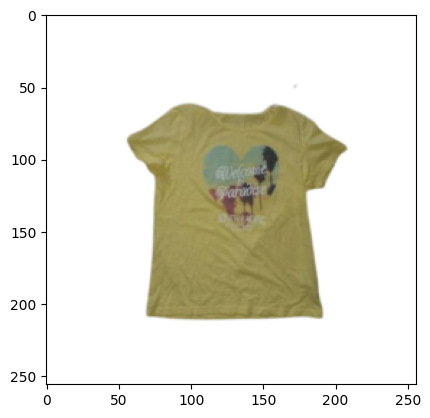

예측치: 
반팔티 - 1471.54 민소매 - 949.54 점퍼/짚업 - 870.63 


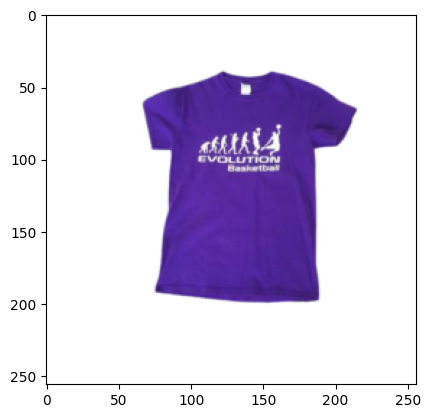

예측치: 
반팔티 - 1778.16 민소매 - 996.91 원피스 - 746.14 


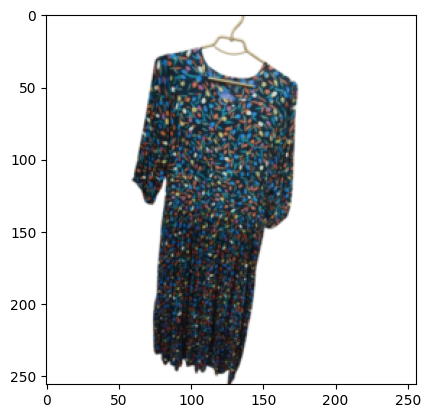

예측치: 
원피스 - 1767.97 점프수트 - 1130.15 셔츠/블라우스 - 864.23 


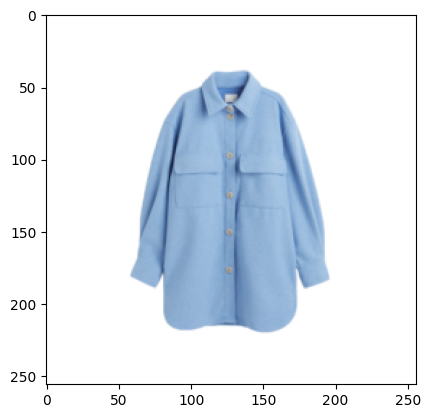

예측치: 
셔츠/블라우스 - 1429.55 코트 - 1178.78 재킷 - 1107.22 


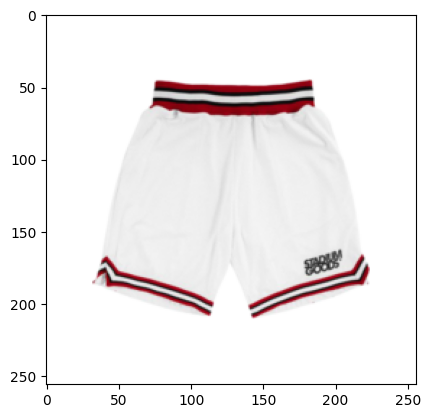

예측치: 
반바지 - 1785.18 미니스커트 - 814.42 점퍼/짚업 - 801.85 


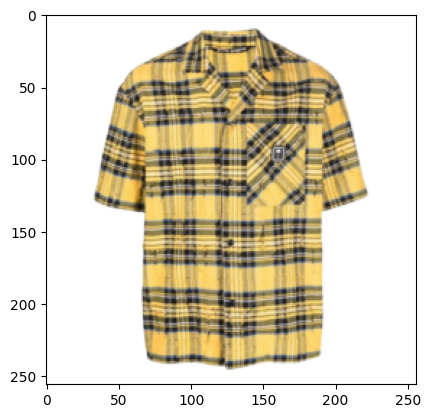

예측치: 
셔츠/블라우스 - 1332.59 코트 - 1001.17 반팔티 - 946.68 


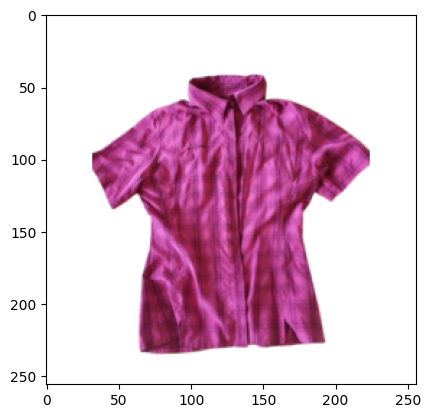

예측치: 
반팔티 - 1422.06 셔츠/블라우스 - 1202.77 니트웨어 - 697.95 


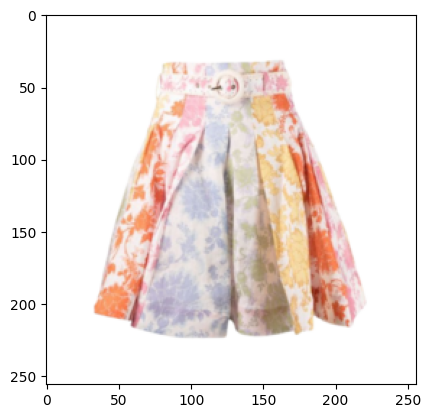

예측치: 
반바지 - 1589.28 롱스커트 - 1097.16 긴바지 - 1002.44 


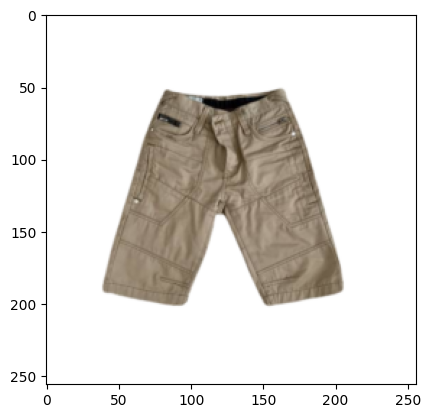

예측치: 
반바지 - 1230.68 긴바지 - 898.17 미니스커트 - 795.09 


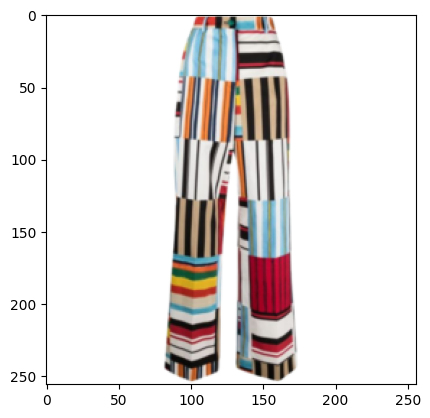

예측치: 
긴바지 - 1823.41 점프수트 - 960.32 가디건 - 789.44 


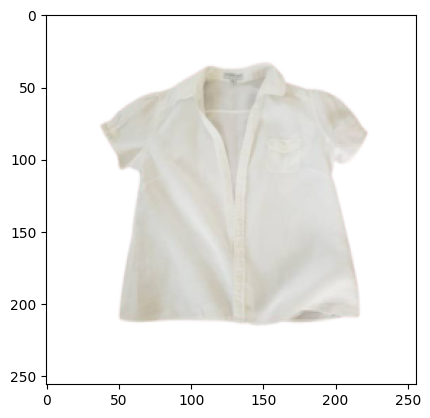

예측치: 
셔츠/블라우스 - 1298.35 베스트 - 829.98 반팔티 - 806.17 


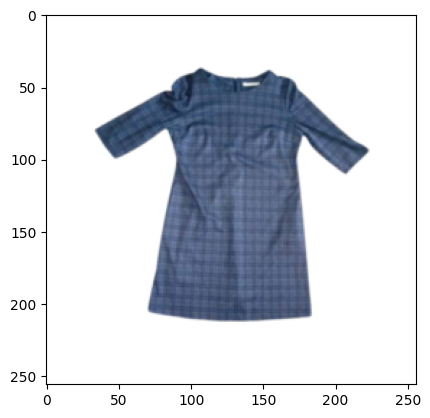

예측치: 
원피스 - 1676.55 점프수트 - 1144.46 셔츠/블라우스 - 981.17 


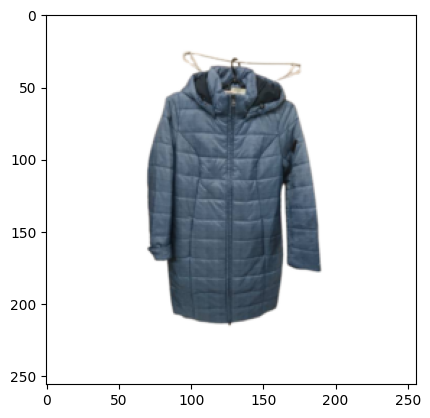

예측치: 
원피스 - 953.74 패딩 - 951.96 셔츠/블라우스 - 945.84 


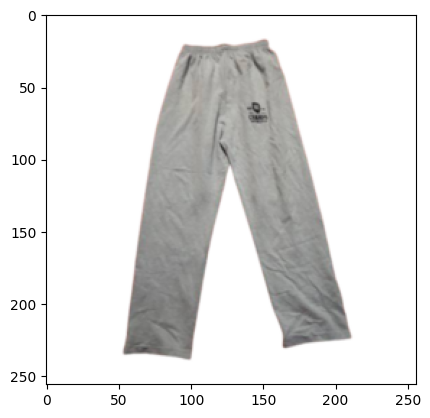

예측치: 
긴바지 - 1856.75 점프수트 - 791.26 셔츠/블라우스 - 732.85 


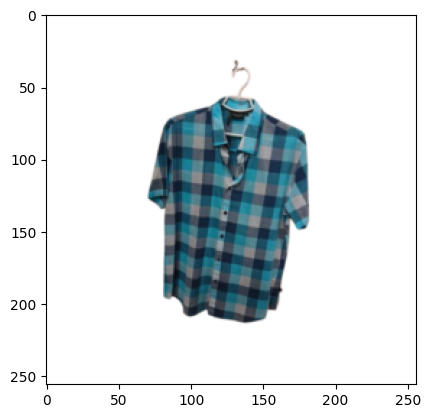

예측치: 
셔츠/블라우스 - 1502.39 원피스 - 1046.57 반팔티 - 771.57 


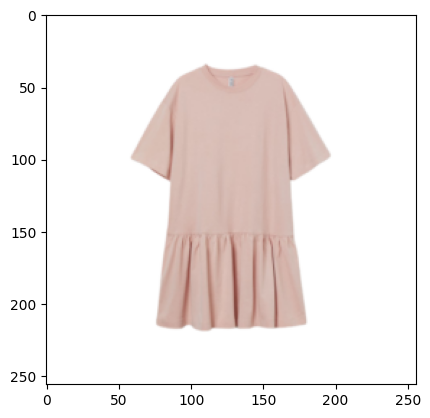

예측치: 
원피스 - 1524.82 반팔티 - 1157.73 점프수트 - 819.51 


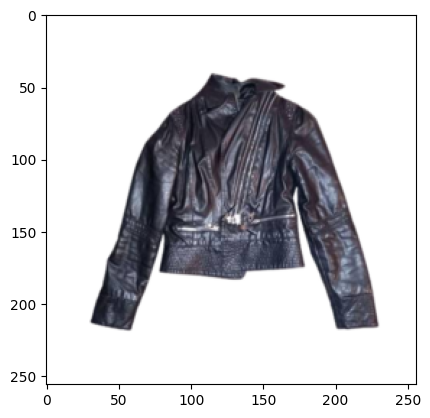

예측치: 
점퍼/짚업 - 1015.16 재킷 - 953.97 셔츠/블라우스 - 853.64 


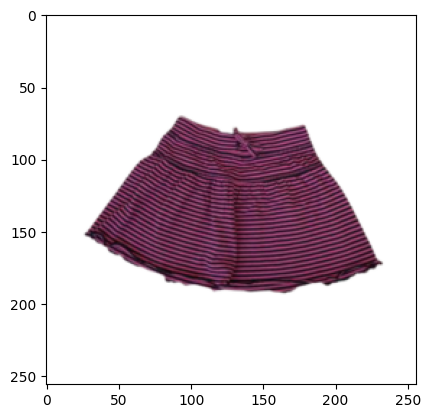

예측치: 
반바지 - 1508.77 미니스커트 - 996.91 민소매 - 774.36 


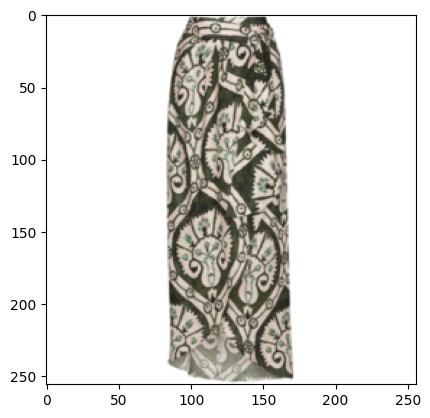

예측치: 
롱스커트 - 1529.83 긴바지 - 1049.90 원피스 - 914.45 


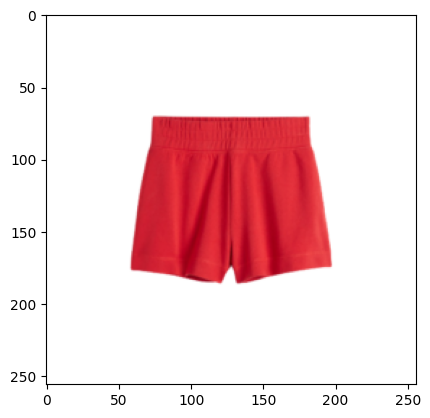

예측치: 
반바지 - 2027.79 미니스커트 - 972.02 민소매 - 528.72 


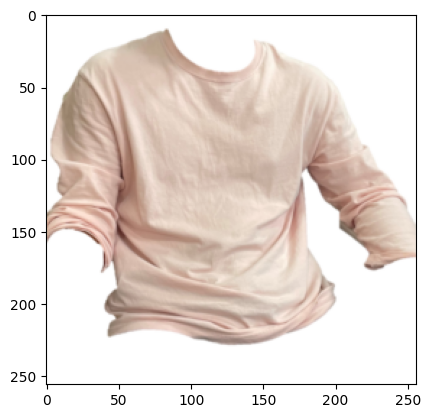

예측치: 
긴팔티 - 1555.59 반팔티 - 1376.30 니트웨어 - 1065.07 


In [27]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from PIL import Image
import os

# 라벨을 숫자로 변환
int_to_labels = {0: '긴팔티', 1: '반팔티', 2: '셔츠/블라우스', 3: '니트웨어', 4: '후드티', 5: '민소매', 
                 6: '긴바지', 7: '반바지', 8: '롱스커트', 9: '미니스커트', 10: '코트', 
                 11: '재킷', 12: '점퍼/짚업', 13: '패딩', 14: '가디건', 15: '베스트', 16: '원피스', 17: '점프수트'}

def imshow(img):  
    # 텐서 이미지를 numpy로 변환
    img = img / 2 + 0.5  # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))  # RGB 형태로 변환하여 출력
    plt.show()
    
# 테스트 데이터 생성
transform = transforms.Compose(
    [
        transforms.Lambda(lambda img: resize_and_pad(img)),
#         transforms.RandomApply([
#             transforms.RandomHorizontalFlip(),
#             transforms.RandomVerticalFlip(),
#             transforms.RandomRotation(180),
#         ], p=0.9),
        transforms.ToTensor(), 
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ]
)


img_dir = '/home/j-j9s006/test_dataset'
list = os.listdir(img_dir)
png_list = [file for file in list if file.endswith(".png")]

# 모델을 평가 모드로 설정
model = torchvision.models.efficientnet_v2_s(weights = None)
model.load_state_dict(torch.load('efficientnet_v2_s_type_ver1.pth', map_location = device))

model.classifier[1].out_features = 18

print(model.classifier)

model.eval()
model.to(device)

with torch.no_grad():    
    for img_name in png_list:
        image = Image.open(img_dir + '/' + img_name)
        if image.mode == 'RGBA':
            r, g, b, a = image.split()
            bg = Image.new('RGB', image.size, (255, 255, 255))  # 흰색 배경
            bg.paste(image, mask=a)
            image = bg
        image = transform(image).unsqueeze(0)
        imshow(torchvision.utils.make_grid(image))
        
        image = image.to(device)
        outputs = model(image)
#         print(outputs.shape)
        values, indices = torch.topk(outputs, 3)  # 상위 3개의 확률과 인덱스를 가져옴

        top3_labels = [int_to_labels[idx.item()] for idx in indices[0]]
        top3_probs = [val.item() * 100 for val in values[0]]

        # 결과 출력
        print('예측치: ')
        for n in range(3):
            print('%s - %.2f' % (top3_labels[n], top3_probs[n]), end = ' ')
        print()
